#**Optimizing Telecom Networks Through Terrain and Clutter Mapping: A Deep Learning Approach**

<img src="https://github.com/Explore-AI/internship-project-2401-05/blob/model_training/Ariel_image.jpg?raw=1" style="width:950px;height:550px"/>

<a id="cont"></a>

## Table of Contents
* <b>[1. Project Overview](#chapter1)
    * [1.1 Introduction](#section_1_1)
        * [1.1.1 Problem Statement](#sub_section_1_1_1)
        * [1.1.2 Aim](#sub_section_1_1_2)
        * [1.1.3 Objectives](#section_1_1_3)
    
* <b>[2. Importing Packages](#chapter2)
* <b>[3. Loading Data](#chapter3)
* <b>[4. Data Cleaning](#chapter4)
* <b>[5. Exploratory Data Analysis](#chapter5)
* <b>[6. Data Preprocessing](#chapter6)
* <b>[7. Model training and evaluation](#chapter7)
  * <b>[7.1.Metrics, Loss, and Optimizer](#chapter7)
  * <b>[7.2 UNET Model Implementation](#chapter7)
  * <b>[7.3 Set Up Callbacks](#chapter7)
  * <b>[7.4 U-Net Architecture Validation Results](#chapter7)
  * <b>[7.5 U-Net Architecture Test Results](#chapter7)
  * <b>[7.6 Saving the Model and History](#chapter7)
  
* <b>[8. conclusion](#chapter7)

## 1. Project Overview <a class="anchor" id="chapter1"></a>

### 1.1 Introduction <a class="anchor" id="section_1_1"></a>

In the fast-evolving world of telecommunications, where the demand for uninterrupted connections reigns supreme, the pressure to maintain powerful and reliable networks is greater than ever. Whether it's streaming high-definition videos, managing an intricate web of IoT devices, or keeping voice calls clear and uninterrupted, every second of delay or signal loss can cripple the user experience. Telecom operators work tirelessly behind the scenes to provide smooth communication across cities and rural areas, ensuring people stay connected, no matter where they are.

But beneath the surface of this digital age lies a silent battle against nature and architecture. The strategic placement of towers and antennas can make or break a network’s performance. Without precise planning, signals can falter, devoured by skyscrapers, swallowed by dense forests, or scattered by mountains. Picture a tower nestled between towering high-rises or suffocated by thick vegetation. A misstep in infrastructure deployment could unleash havoc, plunging thousands into communication dead zones. The frustration of a buffering video or a dropped call is only the tip of the iceberg — at stake is the lifeline of modern communication.

Telecom operators fight back by harnessing clutter data: detailed information about everything that obstructs signal paths — buildings, roads, vegetation, and more. However, gathering this vital intelligence is no small feat. Operators rely on costly data from specialized providers or high-tech equipment. The challenge? It’s a time-consuming and expensive process, making every decision on network design a high-stakes gamble.

This project tackles these challenges by offering a game-changing, cost-effective solution. By leveraging the DeepGlobe Land Cover Classification Dataset alongside the power of machine learning, we will build advanced models capable of estimating heights and segmenting obstacles with surgical precision. The dataset introduces a multi-class segmentation task, enabling automatic classification of land cover types such as urban, agriculture, rangeland, forest, water, barren, and unknown. Its availability allows us to decode terrain and clutter maps, equipping telecom operators with the insights needed to design networks that slice through interference like a hot knife through butter.

#### 1.1.1 Problem Statement <a class="anchor" id="sub_section_1_1_1"></a>

In the field of wireless communication, radio frequency propagation is greatly impacted by surrounding clutter, such as buildings, trees, and terrain variations. Telecom operators require detailed height and segmentation data to make informed decisions about tower placement and optimize network performance. However, acquiring this data is expensive and time-consuming.

The challenge lies in developing a machine learning model that can use open-source satellite images to predict height and segmentation data, reducing the need for costly manual data collection. This project seeks to offer an alternative solution that leverages freely available data to accurately map clutter, ultimately improving signal transmission and reception for telecom operators.

#### 1.1.2 Aim <a class="anchor" id="sub_section_1_1_2"></a>

The aim of this study is to develop a cost-effective, data-driven solution by developing machine learning models that use open-source satellite and LiDAR imagery to estimate both height and segmentation. By accurately mapping clutter and terrain, these models will help optimize wireless network design, saving telecom operators time and resources while improving signal reliability.

#### 1.1.3 Objectives <a class="anchor" id="section_1_1_3"></a>

1. **Develop a Height Estimation Model:** Build a machine learning model, using CNN-based architectures, to estimate the height of objects (such as buildings, trees, and terrain) from satellite images. The output will be used to create digital elevation models (DEMs) that provide a 3D representation of the Earth's surface.

2. **Implement Segmentation Models:** Create a segmentation model using U-Net or similar architectures to divide satellite images into distinct categories, such as roads, buildings, trees, and open spaces. This will help identify land features that impact signal propagation.

3. **Integrate Open-Source Data:** Use publicly available LiDAR data to provide precise elevation information, serving as ground truth for training the height estimation model.

4. **Optimize Model Performance:** Develop a robust pipeline for data preprocessing, model training, and evaluation to ensure accurate predictions for both height and segmentation tasks. Use CNNs, U-Net, and segmentation algorithms like DeepLab and Mask R-CNN to fine-tune model performance.

5. **Apply the Models to Telecom RFP Use Cases:** Integrate the height and segmentation data to conduct clutter analysis, providing telecom operators with actionable insights for optimizing network coverage, tower placement, and minimizing interference in different terrains.

### 1.2 Dataset Overview <a class="anchor" id="section_1_2"></a>

The dataset originates from [Kaggle](https://www.kaggle.com/balraj98/deepglobe-land-cover-classification-dataset), with the original source provided by the [Land Cover Classification Track in DeepGlobe's 2018 Challenge](https://competitions.codalab.org/competitions/18468).

The training set consists of 803 RGB satellite images, each with a resolution of 2448x2448 pixels. However, due to system constraints, these large images will be divided into smaller patches to facilitate processing. Each image has a pixel resolution of 50cm, and the data was collected by DigitalGlobe's satellite. The dataset also includes 171 validation images and 172 test images, but masks are not provided for these. To create a balanced dataset, we will combine the original validation and test images into a new test set and split the training set, allocating a portion of it for validation with masks

*Labels:*

Each satellite image is paired with a corresponding mask image that annotates land cover using RGB color codes for seven classes:
- `Urban land:` 0,255,255 - Man-made, built up areas with human artifacts (can ignore roads for now which is hard to label)
  
- `Agriculture land:` 255,255,0 - Farms, any planned (i.e. regular) plantation, cropland, orchards, vineyards, nurseries, and ornamental horticultural areas; confined feeding operations.
  
- `Rangeland:` 255,0,255 - Any non-forest, non-farm, green land, grass
  
- `Forest land:` 0,255,0 - Any land with x% tree crown density plus clearcuts.

- `Water:` 0,0,255 - Rivers, oceans, lakes, wetland, ponds.
  
- `Barren land:` 255,255,255 - Mountain, land, rock, dessert, beach, no vegetation
  
- `Unknown:` 0,0,0 - Clouds and others

File names for satellite images and the corresponding mask image are id _sat.jpg and id _mask.png. id is a randomized integer.

> Data citation:

@InProceedings{DeepGlobe18,
 author = {Demir, Ilke and Koperski, Krzysztof and Lindenbaum, David and Pang, Guan and Huang, Jing and Basu, Saikat and Hughes, Forest and Tuia, Devis  and Raskar, Ramesh}, title = {DeepGlobe 2018: A Challenge to Parse the Earth Through Satellite Images}, booktitle = {The IEEE Conference on Computer Vision and Pattern Recognition (CVPR) Workshops}, month = {June}, year = {2018}
}

## 2. Importing Packages <a class="anchor" id="chapter2"></a>


This code cell imports various libraries and modules essential for different tasks:

- **AWS S3 Access**:
  - `boto3`: For interacting with AWS S3 to retrieve or store files.

- **Data Manipulation and Analysis**:
  - `pandas`: For structured data manipulation.
  - `numpy`: For numerical computations.

- **Visualization**:
  - `matplotlib.pyplot`: For plotting and data visualization.

- **File and Image Processing**:
  - `os`, `pathlib.Path`: For handling file paths and directories.
  - `PIL.Image`: For image processing.
  - `cv2` (OpenCV): For advanced image operations.

- **Transformations and Utility Functions**:
  - `torchvision.transforms`: For applying transformations to images.
  - `io` and `BytesIO`: For handling in-memory binary streams.
  - `collections.defaultdict`: For creating dictionaries with default values.
  - `math`: For mathematical operations.

This setup provides a robust environment for tasks such as data preprocessing, image transformations, machine learning model preparation, and cloud storage interactions.

In [1]:
# Importing pandas for data manipulation and analysis
import pandas as pd

# Importing numpy for numerical operations and handling arrays
import numpy as np

# Importing matplotlib for plotting graphs and charts
import matplotlib.pyplot as plt

# Importing the os module for interacting with the operating system, such as file and directory operations
import os

# Importing the Image module from the Python Imaging Library (Pillow) for opening, manipulating, and saving images
from PIL import Image

# Importing Path from the pathlib module, offering object-oriented file path manipulation
from pathlib import Path

# Importing the defaultdict class from the collections module for creating dictionaries with default values for nonexistent keys
from collections import defaultdict

# Importing the OpenCV library for image processing and computer vision tasks
import cv2

# Importing the transforms module from torchvision for preprocessing and augmenting image datasets in PyTorch
import torchvision.transforms as transforms

# Importing the io module, which handles I/O streams such as file handling in memory
import io

# Importing the BytesIO class from the io module, used for reading and writing binary streams in memory
from io import BytesIO

# Importing the math module for mathematical functions like sqrt and sin for precise calculations
import math

# Importing the boto3 library, a Python SDK for AWS services, enabling interaction with cloud storage or services like S3
#import boto3

# Enabling TensorFlow version 2.x
%tensorflow_version 2.x
import tensorflow as tf

# Importing the keras module from TensorFlow for deep learning tasks
from tensorflow import keras

# Importing glob for file pattern matching
import glob

# Importing pickle for object serialization and deserialization
import pickle

# Importing copy for creating deep copies of objects
import copy

# Importing additional modules from TensorFlow for building and optimizing models
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import backend as K
from tensorflow.keras.activations import softmax
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model

# Importing warnings to handle warnings in the code
import warnings

# Importing random for generating random numbers or making random choices
import random


Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


**Random Seed Setting**: Setting the random seed is an important practice when you need reproducibility in your experiments. By fixing the random number generator, you ensure that the results of the code will be consistent, which is crucial for debugging, testing, or comparing different experiments.

In [2]:
# Random Seed

# The random seed
random_seed = 42

# Set random seed in tensorflow
tf.random.set_seed(random_seed)

# Set random seed in numpy
np.random.seed(random_seed)

In [3]:
# Ignore warnings
warnings.filterwarnings('ignore')

## 3. Loading Data <a class="anchor" id="chapter3"></a>

### 3.1 Data loading on Google Colab

To load data on google colab the follwing codes are used. This code below is used to set the location for file access or saving in Google Drive when running a notebook in Google Colab. By using this absolute path, you can work with files stored in your Google Drive directly from your Colab environment.

In [4]:
from google.colab import drive
import sys

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
abspath_curr = '/content/drive/My Drive/'

In [6]:
# Print the number of GPUs available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# Test to see if GPU is found and connected
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('\nFound GPU at: {}'.format(device_name))
  print('\nCurrently using:')
  !nvidia-smi -L

Num GPUs Available:  1

Found GPU at: /device:GPU:0

Currently using:
GPU 0: Tesla T4 (UUID: GPU-9ead5814-22d3-559d-d449-1fb12631e2cd)


In [7]:
meta_df = pd.read_csv(abspath_curr + "/CLERAGY PROJECT/metadata.csv")

meta_df.head()

,image_id,split,sat_image_path,mask_path
0,100694,train,train/100694_sat.jpg,train/100694_mask.png
1,102122,train,train/102122_sat.jpg,train/102122_mask.png
2,10233,train,train/10233_sat.jpg,train/10233_mask.png
3,103665,train,train/103665_sat.jpg,train/103665_mask.png
4,103730,train,train/103730_sat.jpg,train/103730_mask.png


In [8]:
class_df = pd.read_csv(abspath_curr + "/CLERAGY PROJECT/class_dict.csv")

class_df.head(10)

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255
5,barren_land,255,255,255
6,unknown,0,0,0



To load our data we will use AWS Boto3 library, to interact with Amazon S3, a scalable cloud storage service. This will allows us to  access, manage, and retrieve data stored in S3 buckets. The series of code below first establishes a connection to AWS S3 by setting up a client and a resource, allowing for both low-level operations and high-level abstractions. Using these tools, we can list available buckets to verify access and then retrieve metadata about objects within a specific bucket. This process is essential for integrating cloud-stored data into workflows. By leveraging AWS S3, we ensure secure, scalable, and efficient access to datasets, enabling seamless collaboration and data processing in cloud environments.

In [ ]:
# Set up boto3 client
s3 = boto3.client('s3')

In [ ]:
s3 = boto3.resource(
    service_name='s3',
    region_name='XXXXXXX', #for security purposes i cant provide the real code used here
    aws_access_key_id='XXXXXXX', #for security purposes i cant provide the real code used here
    aws_secret_access_key='XXXXXXX' #for security purposes i cant provide the real code used here
)

# Print out bucket names
for bucket in s3.buckets.all():
    print(bucket.name)

2207-01-mobile-strength-data
2207-02-mobile-strength-tool
2207-03-fault-logging-chatbot-a
2207-04-fault-logging-chatbot-b
2207-05-financial-statement-fraud-detection-a
2207-06-financial-statement-fraud-detection-b
2207-07-galaxy-classifier
2207-08-dalrrd-daily-commodity-prices-a
2207-09-dalrrd-daily-commodity-prices-b
2207-10-rainfall-data-problem-a
2207-11-rainfall-data-problem-b
2207-12-sewage-pumping-stations-a
2207-13-sewage-pumping-stations-b
2207-14-social-listening-tool
2207-15-water-systems-landscape
2207-16-fibre-competitive-intensity-model-a
2207-17-fibre-competitive-intensity-model-b
2207-18-fibre-competitive-intensity-model-c
2207-19-where-can-i-work-today-app
2207-20-llm-based-faq-chatbot
2301-02-mobile-signal-strength-b
2301-03-credit-default
2301-04-pet-insurance
2301-05-motor-insurance-claims
2301-06-bridging-career-gaps-a
2301-07-bridging-career-gaps-b
2301-07-ratail-media-driver-modeling
2301-08-digitising-open-data
2301-09-estimating-gdp-a
2301-10-estimating-gdp-b
23

In [ ]:
import os
os.environ['AWS_ACCESS_KEY_ID'] = 'XXXXXXXX'   #for security purposes i cant provide the real code used here
os.environ['AWS_SECRET_ACCESS_KEY'] = 'XXXXXX' #for security purposes i cant provide the real code used here


In [ ]:
# Initialize an S3 client
s3 = boto3.client('s3')

# Define the bucket name
bucket_name = '2401-05-height-segmentation-model-c'

# List the objects in the bucket
response = s3.list_objects_v2(Bucket=bucket_name)

# Print the keys (file paths) of all objects in the bucket
if 'Contents' in response:
    for obj in response['Contents']:
        print(obj['Key'])
else:
    print("No objects found in the bucket.")

INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/class_dict.csv
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/metadata.csv
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/100877_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/103215_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/103742_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/105036_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/107780_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/108490_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/110224_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/112946_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/114542_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/115800_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/118757_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/test/119896_sat.jpg
INTERNSHIP GROUP PROJECT/INTERNS

In [ ]:
# Define your S3 bucket and file path
bucket_name = '2401-05-height-segmentation-model-c'
file_key = 'INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/metadata.csv'

# Create a boto3 S3 client
s3_client = boto3.client('s3')

# Use pandas to read the CSV file from S3
obj = s3_client.get_object(Bucket=bucket_name, Key=file_key)
meta_df = pd.read_csv(obj['Body'])

# Print the DataFrame to verify
print(meta_df.head())

   image_id  split        sat_image_path              mask_path
0    100694  train  train/100694_sat.jpg  train/100694_mask.png
1    102122  train  train/102122_sat.jpg  train/102122_mask.png
2     10233  train   train/10233_sat.jpg   train/10233_mask.png
3    103665  train  train/103665_sat.jpg  train/103665_mask.png
4    103730  train  train/103730_sat.jpg  train/103730_mask.png


In [ ]:
# Define your S3 bucket and file path
bucket_name = '2401-05-height-segmentation-model-c'
file_key = 'INTERNSHIP GROUP PROJECT/INTERNSHIP GROUP PROJECT/class_dict.csv'

# Create a boto3 S3 client
s3_client = boto3.client('s3')

# Use pandas to read the CSV file from S3
obj = s3_client.get_object(Bucket=bucket_name, Key=file_key)
class_df = pd.read_csv(obj['Body'])

# Print the DataFrame to verify
print(class_df.head())

               name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255


Through AWS services we can now view our dataset from an Amazon S3 bucket. Boto3 is used to create an S3 client and pandas to read the CSV file directly from the S3 bucket. This CSV, referred to as `meta_df`, provides essential metadata for each satellite image and corresponding mask, including the unique image_id, dataset split (e.g., train, test), sat_image_path to the RGB satellite images, and mask_path to the land cover annotation masks. Additionally, a separate DataFrame, class_df, outlines the label classes for land cover types, each associated with a unique RGB color code. This allows for precise identification of land cover types in each mask image.

Further investigation of meta_df indicates that the validation satellite images don't have associated mask paths. This needs to be rectified. Below we will folow a series of steps to update the validation folder such that it has validation masks for each statelite image.

In [9]:
# View valid data file paths in meta_df
meta_df[meta_df['split'] == 'valid'].head()

,image_id,split,sat_image_path,mask_path
803,105036,valid,valid/105036_sat.jpg,NaN
804,107780,valid,valid/107780_sat.jpg,NaN
805,108490,valid,valid/108490_sat.jpg,NaN
806,127801,valid,valid/127801_sat.jpg,NaN
807,128240,valid,valid/128240_sat.jpg,NaN


In [10]:
# Update meta_df
meta_df['sat_image_path'] = meta_df['sat_image_path'].str.replace('valid/', 'test/')
meta_df['split'] = meta_df['split'].str.replace('valid', 'test')

In [11]:
# Create divides for train, test, val
train_df = meta_df[meta_df['split'] == 'train']

train_num_samples = round(len(train_df)*0.9)
val_num_samples = len(train_df) - train_num_samples

In [12]:
# Shuffle all rows of the DataFrame
train_df = train_df.sample(frac=1, random_state=random_seed).reset_index(drop=True)
train_df.head()

,image_id,split,sat_image_path,mask_path
0,315352,train,train/315352_sat.jpg,train/315352_mask.png
1,427774,train,train/427774_sat.jpg,train/427774_mask.png
2,28689,train,train/28689_sat.jpg,train/28689_mask.png
3,661864,train,train/661864_sat.jpg,train/661864_mask.png
4,675849,train,train/675849_sat.jpg,train/675849_mask.png


In [13]:
train_df['split'].iloc[:train_num_samples] = 'train'
train_df['split'].iloc[train_num_samples:] = 'valid'

In [14]:
non_train_df = meta_df[meta_df['split'] != 'train']

train_df['sat_image_path'] = train_df['sat_image_path'].str.replace('train/', 'train/train_images/images/')
train_df['mask_path'] = train_df['mask_path'].str.replace('train/', 'train/train_masks/masks/')

meta_df = pd.concat([train_df, non_train_df], axis=0)
meta_df.head()

,image_id,split,sat_image_path,mask_path
0,315352,train,train/train_images/images/315352_sat.jpg,train/train_masks/masks/315352_mask.png
1,427774,train,train/train_images/images/427774_sat.jpg,train/train_masks/masks/427774_mask.png
2,28689,train,train/train_images/images/28689_sat.jpg,train/train_masks/masks/28689_mask.png
3,661864,train,train/train_images/images/661864_sat.jpg,train/train_masks/masks/661864_mask.png
4,675849,train,train/train_images/images/675849_sat.jpg,train/train_masks/masks/675849_mask.png


In [15]:
non_valid_df = meta_df[meta_df['split'] != 'valid']
valid_df = meta_df[meta_df['split'] == 'valid']

valid_df['sat_image_path'] = valid_df['sat_image_path'].str.replace('train/train_images/images/', 'val/val_images/images/')
valid_df['mask_path'] = valid_df['mask_path'].str.replace('train/train_masks/masks/', 'val/val_masks/masks/')

meta_df = pd.concat([valid_df, non_valid_df], axis=0)
meta_df.head()

,image_id,split,sat_image_path,mask_path
723,325354,valid,val/val_images/images/325354_sat.jpg,val/val_masks/masks/325354_mask.png
724,277994,valid,val/val_images/images/277994_sat.jpg,val/val_masks/masks/277994_mask.png
725,699650,valid,val/val_images/images/699650_sat.jpg,val/val_masks/masks/699650_mask.png
726,549959,valid,val/val_images/images/549959_sat.jpg,val/val_masks/masks/549959_mask.png
727,889920,valid,val/val_images/images/889920_sat.jpg,val/val_masks/masks/889920_mask.png


In [16]:
meta_df[meta_df['split'] == 'valid'].head()

,image_id,split,sat_image_path,mask_path
723,325354,valid,val/val_images/images/325354_sat.jpg,val/val_masks/masks/325354_mask.png
724,277994,valid,val/val_images/images/277994_sat.jpg,val/val_masks/masks/277994_mask.png
725,699650,valid,val/val_images/images/699650_sat.jpg,val/val_masks/masks/699650_mask.png
726,549959,valid,val/val_images/images/549959_sat.jpg,val/val_masks/masks/549959_mask.png
727,889920,valid,val/val_images/images/889920_sat.jpg,val/val_masks/masks/889920_mask.png


In [17]:
print('Samples in train: ', len(meta_df[meta_df['split'] == 'train']))
print('Samples in validation: ', len(meta_df[meta_df['split'] == 'valid']))
print('Samples in test: ', len(meta_df[meta_df['split'] == 'test']))

Samples in train:  723
Samples in validation:  80
Samples in test:  343


### 3.3 Move Files to the Respective Directories

In [18]:
def make_directory(path):
  """
  Function to make directory if not exits

  Paramater:
    path - path of directory

  Return:
    None
  """
  directory = os.path.dirname(path)
  if not os.path.exists(directory):
    os.makedirs(directory)

  return

In [19]:
make_directory(abspath_curr + '/CLERAGY PROJECT/train/train_images/images/')
make_directory(abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/')

make_directory(abspath_curr + '/CLERAGY PROJECT/val/val_images/images/')
make_directory(abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/')

In [20]:
def move_files(list_filenames, source_path, target_path):
  """
  Function to move files from source to target directory based on a list of filenames within source

  Parameters:
    list_filesname - list of filenames
    source_path - path of source directory
    target_path - path of target directory

  Return:
    None
  """
  for file_name in list_filenames:
      try:
        shutil.move(os.path.join(source_path, file_name), os.path.join(target_path, file_name))
      except FileNotFoundError:
        continue

In [21]:
# List of test, val filenames
train_sat_img_path = meta_df[meta_df['split'] == 'train']['sat_image_path']
train_sat_img_path = train_sat_img_path.str.replace('train/train_images/images/', '')

new_val_sat_img_path = meta_df[meta_df['split'] == 'valid']['sat_image_path']
new_val_sat_img_path = new_val_sat_img_path.str.replace('val/val_images/images/', '')

train_msk_img_path = meta_df[meta_df['split'] == 'train']['mask_path']
train_msk_img_path = train_msk_img_path.str.replace('train/train_masks/masks/', '')

new_val_msk_img_path = meta_df[meta_df['split'] == 'valid']['mask_path']
new_val_msk_img_path = new_val_msk_img_path.str.replace('val/val_masks/masks/', '')

old_val_img_path = os.listdir(abspath_curr + '/CLERAGY PROJECT/val/')

In [22]:
def folder_is_empty(path, img_types=['.png', '.jpg', '.tif']):
  """
  Function to check if a filepath is empty

  Parameters:
    path - filepath to image or mask data

  Return:
    True if empty, False if not

  We can use this function like this:
    if not False:
      do X
    else:
      do Y

  this will do X.
  """

  if any(list(map(lambda x: True if x in ''.join(os.listdir(path)) else False, img_types))):
    return False
  else:
    return True

In [23]:
# Moves files from main folders of train, val to sub-directories

# Old validation goes to test
if not folder_is_empty(abspath_curr + '/CLERAGY PROJECT/val'):
  # image
  move_files(old_val_img_path, abspath_curr + '/CLERAGY PROJECT/val/', abspath_curr + '/CLERAGY PROJECT/test')

# Split old train to new train and new val
if not folder_is_empty(abspath_curr + '/CLERAGY PROJECT/train'):
  # train_image
  move_files(train_sat_img_path, abspath_curr + '/CLERAGY PROJECT/train/', abspath_curr + '/CLERAGY PROJECT/train/train_images/images')
  # train_mask
  move_files(train_msk_img_path, abspath_curr + '/CLERAGY PROJECT/train/', abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks')

  # val_image
  move_files(new_val_sat_img_path, abspath_curr + '/CLERAGY PROJECT/train/', abspath_curr + '/CLERAGY PROJECT/val/val_images/images')
  # val_mask
  move_files(new_val_msk_img_path, abspath_curr + '/CLERAGY PROJECT/train/', abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks')


In [24]:
# Check if images got moved right
print('Train Images: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/train/train_images/images')))
print('Train Masks: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks')))

print('Val Images: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/val/val_images/images')))
print('Val Masks: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks')))

print('Test Images: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/test')))
print('Test Masks: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/test')))

Train Images:  532
Train Masks:  723
Val Images:  65
Val Masks:  80
Test Images:  171
Test Masks:  171


### 3.4 Convert masks to png

Masks are typically preferred in .png format. If masks are not already in this format, convert them to .png

In [25]:
def convert_file_type(filepath, dest_file_type):
  """
  Function to convert all files in a directory to a defined file type

  Parameters:
    filepath - filepath
    dest_file_type - str of dest_file_type ('.png')

  Return:
    None
  """
  for mask_file in os.listdir(filepath):
    try:
        # Attempt to open an image file
        image = cv2.imread(filepath + '/' + mask_file)
    except IOError as e:
        # Report error, and then skip to the next argument
        print ("Problem opening", mask_file, ":", e)
        continue

    # Split our original filename into name and extension
    (name, extension) = os.path.splitext(mask_file)

    # Save new file type
    cv2.imwrite(filepath + '/' + name + dest_file_type, image)

    # Delete original copy
    os.remove(filepath + '/' + mask_file)

In [26]:
# If .jpg or .tif found in masks directories, convert them into .png type

if not folder_is_empty(abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks', img_types=['.jpg', '.tif']):
  convert_file_type(abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks', '.png')

if not folder_is_empty(abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks', img_types=['.jpg', '.tif']):
  convert_file_type(abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks', '.png')

## 4. Data cleaning <a class="anchor" id="chapter4"></a>

An initial step is to update the file paths in the meta_df to the S3 bucket format. We will use string manipulation to set the `sat_image_path` and `mask_path` columns in the Dataframe.

In [ ]:
def check_data(df):
    """This function checks the metadata for missing values and duplicates.

    Parameters:
    df (DataFrame): The metadata DataFrame to check.
    """

    # Check for duplicates in the 'image_id' column
    duplicates = df[df.duplicated(subset='image_id')]
    print(f"Number of duplicate entries: {duplicates.shape[0]}")

    # Check for null values in the DataFrame
    null_values = df.isnull().sum()
    null_columns = null_values[null_values > 0]

    if not null_columns.empty:
        print("Null values found in the following columns:")
        print(null_columns)
    else:
        print("No null values found")

In [ ]:
check_data(meta_df)

Number of duplicate entries: 0
Null values found in the following columns:
mask_path    343
dtype: int64


In [ ]:
# Get class names
class_names = class_df['name'].tolist()
# Get class RGB values
class_rgb_values = class_df[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['urban_land', 'agriculture_land', 'rangeland', 'forest_land', 'water', 'barren_land', 'unknown']
Class RGB values:  [[0, 255, 255], [255, 255, 0], [255, 0, 255], [0, 255, 0], [0, 0, 255], [255, 255, 255], [0, 0, 0]]


In [ ]:
def read_image_from_s3(bucket, key, color=True):
    # Fetch the image from S3
    response = s3.get_object(Bucket=bucket, Key=key)
    image_data = response['Body'].read()

    # Convert image data to a numpy array
    image_array = np.frombuffer(image_data, np.uint8)

    # Decode the image
    if color:
        return cv2.imdecode(image_array, cv2.IMREAD_COLOR)
    return cv2.imdecode(image_array, cv2.IMREAD_GRAYSCALE)


In [ ]:
def view_images(df, bucket_name, num_images=5):
    for index in range(min(num_images, len(df))):  # Limit to the number of available images
        # Get the S3 paths for the specified index
        sat_image_key = df.at[index, 'sat_image_path']
        mask_image_key = df.at[index, 'mask_path']

        # Read the images from S3
        try:
            satellite_image = read_image_from_s3(bucket_name, sat_image_key)
            mask_image = read_image_from_s3(bucket_name, mask_image_key, color=True)
        except Exception as e:
            print(f"Error loading images for index {index}: {e}")
            continue

        # Convert BGR to RGB for displaying with matplotlib
        satellite_image = cv2.cvtColor(satellite_image, cv2.COLOR_BGR2RGB)
        mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)

        # Set up the plot for the current image
        plt.figure(figsize=(12, 6))

        # Display the satellite image
        plt.subplot(1, 2, 1)
        plt.imshow(satellite_image)
        plt.title(f'Satellite Image {index + 1}')
        plt.axis('off')

        # Display the mask image in color
        plt.subplot(1, 2, 2)
        plt.imshow(mask_image)
        plt.title(f'Mask Image {index + 1}')
        plt.axis('off')

        # Show the images
        plt.show()


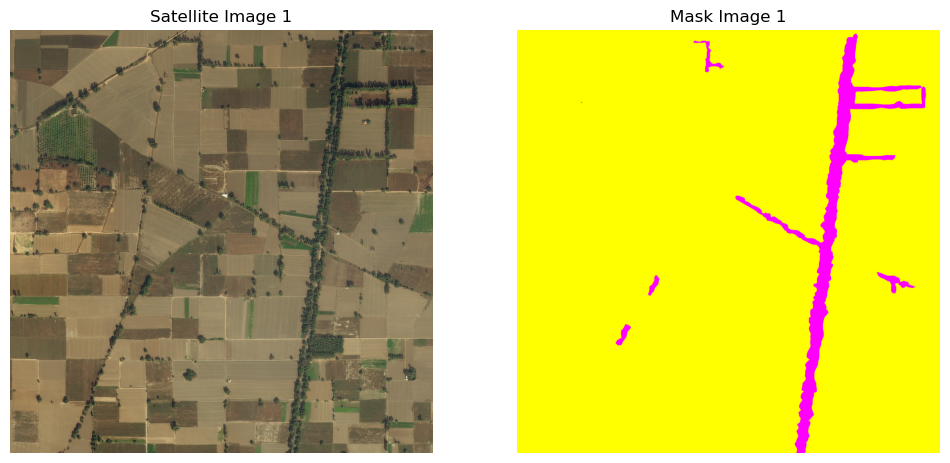

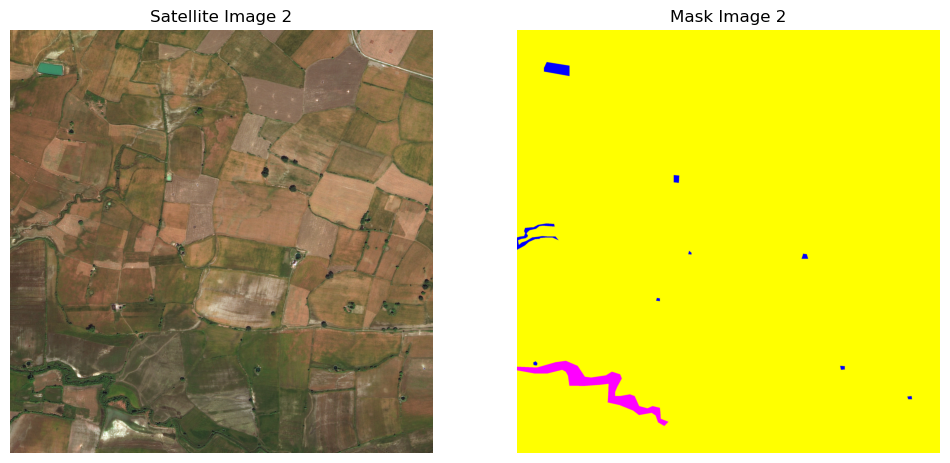

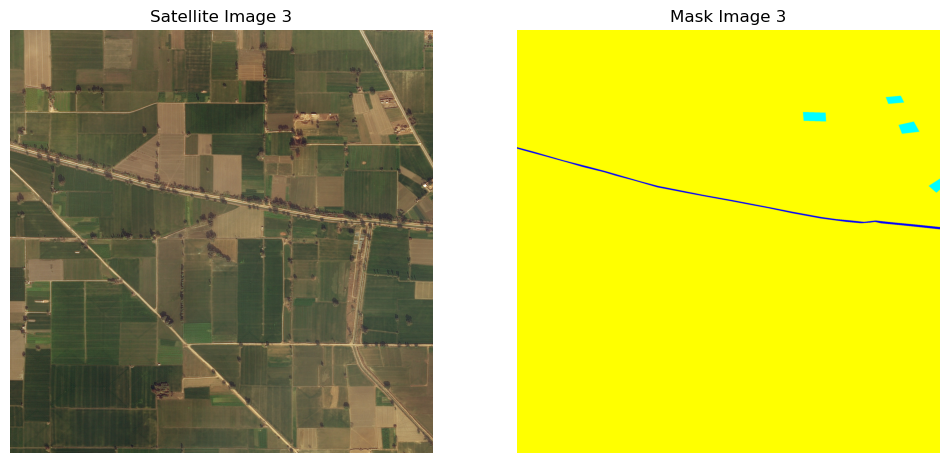

In [ ]:
view_images(meta_df, bucket_name, num_images=3)

## 5. Exploratory Data Analysis <a class="anchor" id="chapter5"></a>

The Exploratory Data Analysis (EDA) section serves as a critical step in understanding the dataset used for this segmentation project. By analyzing the data's structure, distribution, and characteristics, we aim to uncover patterns, identify potential anomalies, and assess the quality of the images and labels. This process helps to inform preprocessing strategies and guides the development of effective segmentation models.

In this section, we will:
- **Inspect the dataset**: Understand the structure of the dataset, including the number of samples, image dimensions, and associated labels.
- **Visualize sample data**: Display representative examples of the satellite images and their corresponding segmentation masks to ensure alignment and quality.
- **Analyze class distribution**: Evaluate the frequency of various segmentation classes (if applicable) to detect imbalances that may affect model training.

By the end of the EDA, we aim to establish a comprehensive understanding of the dataset, which will serve as the foundation for the data preparation and modeling phases.


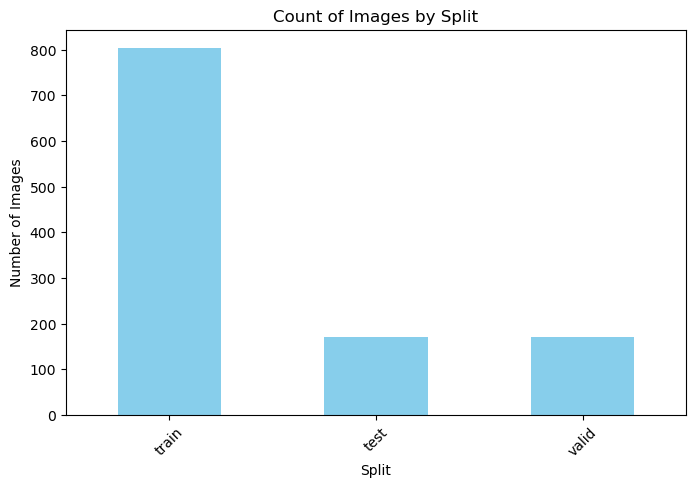

In [ ]:
# Count the number of images in each split
split_counts = meta_df['split'].value_counts()

# Plot
plt.figure(figsize=(8, 5))
split_counts.plot(kind='bar', color='skyblue')
plt.title('Count of Images by Split')
plt.xlabel('Split')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

The dataset is divided into three subsets: **train**, **validation**, and **test**, with each subset containing a specific number of samples. Below is a bar graph visualizing the sample sizes in each subset:

- **Training Set**: Contains **803 samples**, representing the majority of the dataset. This subset is used to train the segmentation model and optimize its parameters.
- **Validation Set**: Contains **123 samples**. This subset is used during model training to tune hyperparameters and prevent overfitting.
- **Test Set**: Contains **107 samples**, which are held out to evaluate the model's performance on unseen data.


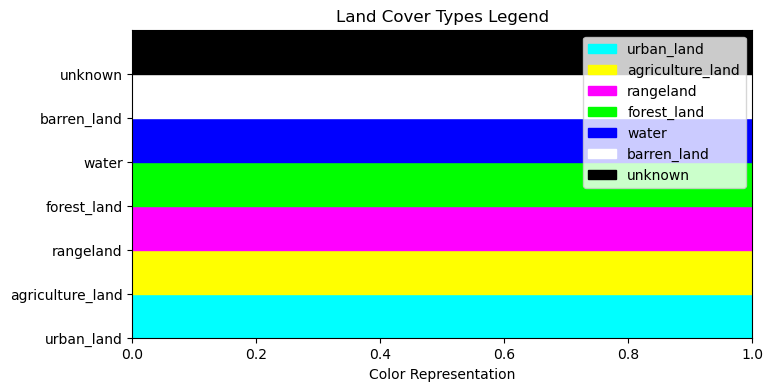

In [ ]:
# Create a color legend
plt.figure(figsize=(8, 4))
for idx, row in class_df.iterrows():
    plt.fill_between([0, 1], idx, idx + 1, color=(row['r']/255, row['g']/255, row['b']/255), label=row['name'])

plt.xlim(0, 1)
plt.ylim(0, len(class_df))
plt.title('Land Cover Types Legend')
plt.xlabel('Color Representation')
plt.yticks(range(len(class_df)), class_df['name'])
plt.grid(False)
plt.legend(loc='upper right')
plt.show()

## 6. Data Preprocessing <a class="anchor" id="chapter6">

In the data preprocessing section, we define a transformation pipeline to preprocess the satellite images and their corresponding mask images. This is essential to standardize the images before they are fed into the machine learning model.

Here we `resize` both the satellite images and mask images to a uniform size of 256x256 pixels. This ensures that the input images have consistent dimensions, which is necessary for training a deep learning model.

`transforms.ToTensor()`:
This converts the images from PIL Image format into PyTorch tensors, which is the required format for feeding data into a model. The ToTensor() transformation also normalizes the pixel values to the range [0, 1], which helps in faster convergence during model training.

The function `preprocess_and_display_images` applies the transformation pipeline and then displays the images using matplotlib.

In [ ]:
# Define transformation pipeline
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

In [ ]:
def preprocess_and_display_images(df, bucket_name, num_images=5):
    """
    This function downloads satellite and mask images from S3, applies transformations,
    and displays the images side by side.

    Parameters:
    df (DataFrame): The DataFrame containing 'sat_image_path' and 'mask_path' columns.
    bucket_name (str): The name of the S3 bucket where images are stored.
    num_images (int): Number of images to display.
    """
    for index in range(min(num_images, len(df))):
        # Get S3 paths for satellite and mask images
        sat_image_path = df.at[index, 'sat_image_path']
        mask_image_path = df.at[index, 'mask_path']

        # Load satellite image from S3
        sat_obj = s3_client.get_object(Bucket=bucket_name, Key=sat_image_path)
        satellite_image = Image.open(io.BytesIO(sat_obj['Body'].read())).convert("RGB")

        # Load mask image from S3 (convert to RGB for color)
        mask_obj = s3_client.get_object(Bucket=bucket_name, Key=mask_image_path)
        mask_image = Image.open(io.BytesIO(mask_obj['Body'].read())).convert("RGB")

        # Apply transformations (if any)
        satellite_image = transform(satellite_image)
        mask_image = transform(mask_image)

        # Convert to numpy for display with matplotlib
        sat_image_np = satellite_image.permute(1, 2, 0).numpy()  # [C, H, W] -> [H, W, C]
        mask_image_np = mask_image.permute(1, 2, 0).numpy()  # [C, H, W] -> [H, W, C]

        # Display the images
        plt.figure(figsize=(12, 6))

        # Display Satellite Image
        plt.subplot(1, 2, 1)
        plt.imshow(sat_image_np)
        plt.title(f'Satellite Image {index + 1}')
        plt.axis('off')

        # Display Mask Image
        plt.subplot(1, 2, 2)
        plt.imshow(mask_image_np)
        plt.title(f'Mask Image {index + 1}')
        plt.axis('off')

        # Show the plot
        plt.show()

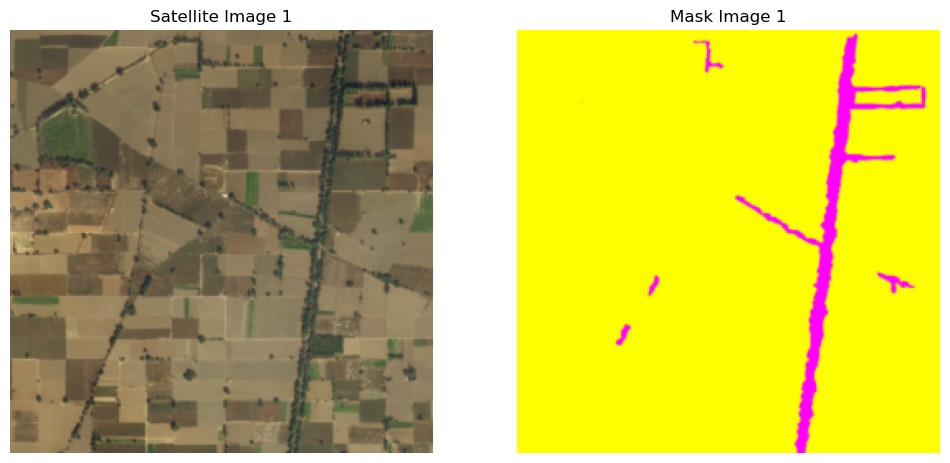

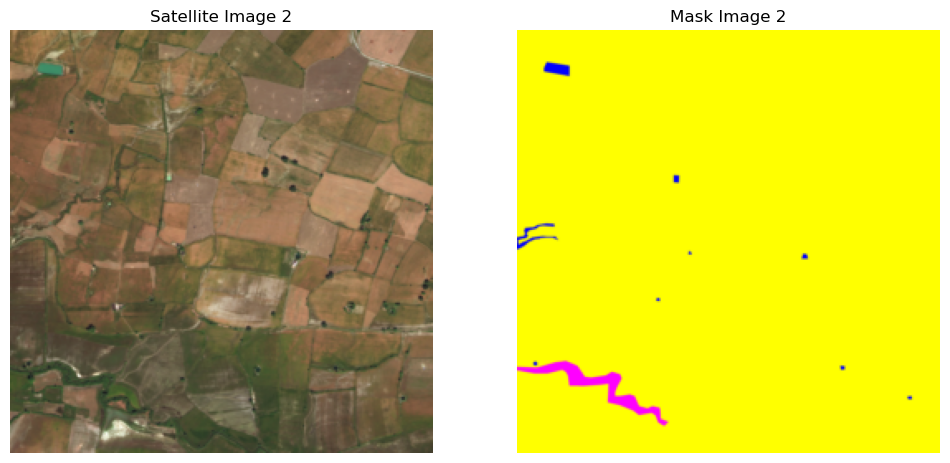

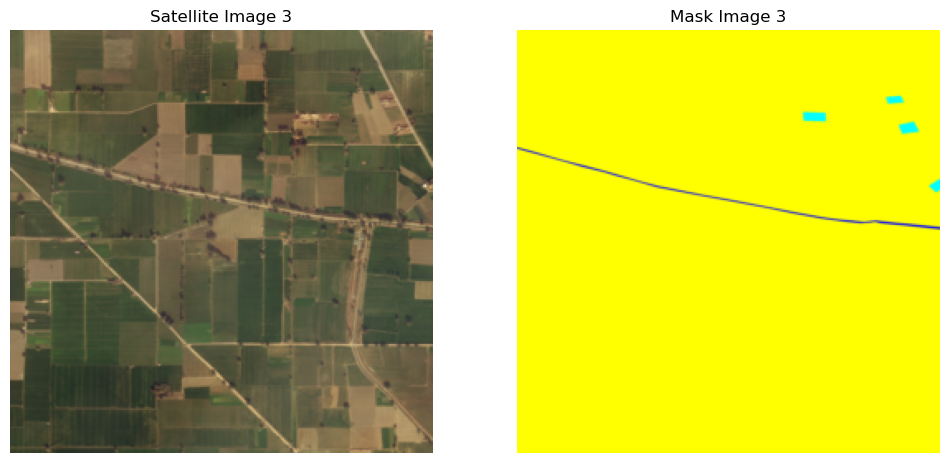

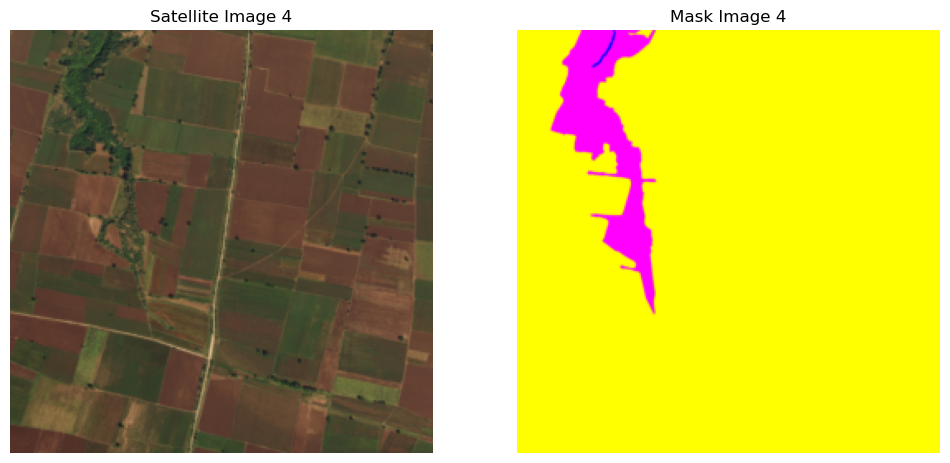

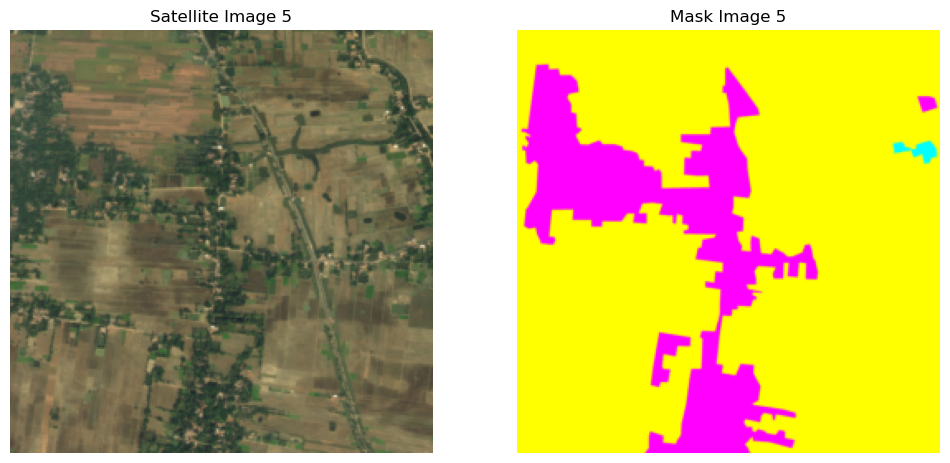

In [ ]:
preprocess_and_display_images(meta_df,bucket_name=bucket_name, num_images=5)

In this step, the goal is to load, preprocess, and visualize satellite and mask images for analysis or model training. The process involves the following key steps:

- **Loading Images from S3:** Satellite (RGB) and mask (segmentation labels, typically grayscale) images are fetched from an S3 bucket.
  
- **Image Transformation:** The images are resized, normalized, and converted into tensor formats suitable for machine learning. The mask images are kept in color format to preserve segmentation details.

- **Color Representation:** Mask images are maintained in color (RGB) rather than grayscale to retain information about different regions or classes

- **Preparing for Visualization:** The images are formatted correctly (height x width x channels) for display using tools like matplotlib.

- **Side-by-Side Display:** Both satellite and mask images are displayed side by side for comparison, allowing visual inspection of how well the mask corresponds to the satellite image.

- **Visual Inspection:** This step helps to evaluate the mask's accuracy and ensure the preprocessing hasn't altered important details.

The pipeline prepares the images for downstream tasks such as model training or further analysis, with a focus on maintaining the integrity of the mask and satellite data for accurate segmentation.

Additionaly from the EDA section we noted that The validation and test images lack masks, therefore we need to adjust the dataset by combining these subsets and creating a new validation set from the training data, which contains masked images. Below is the step-by-step process to address this issue:

* **Merge Validation and Test Sets:**
Combine the existing validation and test images into a single test dataset, which will be used only for final model evaluation.

* **Create New Validation Set:**
Sample a portion of images from the training set (which includes masks) to create a new validation set. This ensures the validation data has both images and corresponding masks, allowing for effective model tuning.

#### Cut up images
The original images are 2448x2448x3 therefore require extensive computing resources to be loaded. To reduce the computational cost of training the model, the images are subdivided into smaller patches to reduce the computing resources required to load a single image into memory and train.

In [27]:
def cut_images(filepath, dest_filepath, n_sub_images):
  """
  Function to convert all masks to only forest labeled masks

  Parameters:
    filepath - source filepath
    dest_filepath - destination filepath
    n_sub_images - number of images to cut

  Return:
    None
  """
  for mask_file in os.listdir(filepath):
    try:
        # Attempt to open an image file
        image = plt.imread(filepath + '/' + mask_file)
    except IOError as e:
        # Report error, and then skip to the next argument
        print ("Problem opening", mask_file, ":", e)
        continue

    pixels = int(image.shape[0] / math.sqrt(n_sub_images))

    count = 0

    for r in range(0,image.shape[0],pixels):
      for c in range(0,image.shape[1],pixels):

        filename = mask_file.split('.')[0]
        extension = mask_file.split('.')[1]

        # Save new file type
        plt.imsave(dest_filepath + filename + '_{}.'.format(count) + extension, image[r:r+pixels, c:c+pixels,:])

        count+=1

    os.remove(filepath + '/' + mask_file)
  print('Images of: {}x{}'.format(pixels, pixels))

In [28]:
run_cut_images = False

if run_cut_images:
  # Images
  cut_images(abspath_curr + '/CLERAGY PROJECT/train/train_images/images/', abspath_curr + '/CLERAGY PROJECT/train/train_images/images/', 16)
  cut_images(abspath_curr + '/CLERAGY PROJECT/val/val_images/images/', abspath_curr + '/CLERAGY PROJECT/val/val_images/images/', 16)
  cut_images(abspath_curr + '/CLERAGY PROJECT/test/', abspath_curr + '/CLERAGY PROJECT/test/', 16)

  # Masks
  cut_images(abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/', abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/', 16)
  cut_images(abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/', abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/', 16)


In [29]:
# Check if images got moved right
print('Train Images: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/train/train_images/images')))
print('Train Masks: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks')))

print('Val Images: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/val/val_images/images')))
print('Val Masks: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks')))

print('Test Images: ', len(os.listdir(abspath_curr + '/CLERAGY PROJECT/test')))


Train Images:  532
Train Masks:  723
Val Images:  65
Val Masks:  80
Test Images:  171


## Class Distribution: Data imbalance

In [30]:
import os
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def get_pixels_class_weights(path, class_map):
    """
    Function to go to specified mask path, go through each image
    and count number of pixels that belong to each class.

    Parameters:
      path: path to images (mask images)
      class_map: class_df (DataFrame with class definitions and RGB values)

    Return:
      pixel_counts: np array of pixel counts in order of class appearance in class_df
    """
    images = os.listdir(path)
    pixel_counts = np.zeros(len(class_map))

    # Iterate through each image in the directory
    for image in images:
        img = plt.imread(os.path.join(path, image))  # Read image

        # Iterate through each class in class_map
        class_counter = 0
        for index, row in class_map.iterrows():
            # Make a deep copy of the image to manipulate RGB values
            new_img = copy.deepcopy(img)

            R = new_img[:, :, 0]  # Red channel
            G = new_img[:, :, 1]  # Green channel
            B = new_img[:, :, 2]  # Blue channel

            # Count pixels that match the class color (RGB values)
            count = (new_img[(R == row['r'] / 255) & (G == row['g'] / 255) & (B == row['b'] / 255)].size) / 3

            # Add the count to the corresponding class
            pixel_counts[class_counter] += count
            class_counter += 1

    return pixel_counts

def pixels_class_weights(paths_list, save_path, class_map=None):
    """
    Function to get pixel counts for each class across multiple image directories
    and calculate the class weights.

    Parameters:
      paths_list: list of paths to mask image directories
      save_path: directory where the results (CSV) will be saved
      class_map: DataFrame mapping class labels to RGB values

    Return:
      class_pixels: pandas DataFrame with classes and their respective pixel counts and weights
    """
    class_pixels = class_map.copy()
    class_pixels['Pixels_Count'] = 0

    for counter, path in enumerate(paths_list):
        # Get the pixel counts for each class in the current directory
        pixels_count_array = get_pixels_class_weights(path, class_map)

        # Add the pixel counts to the DataFrame for this directory
        class_pixels['Pixels_Count_{}'.format(counter)] = pixels_count_array.tolist()
        class_pixels['Pixels_Count'] += class_pixels['Pixels_Count_{}'.format(counter)]  # Sum across all paths

        # Drop intermediate columns
        class_pixels.drop('Pixels_Count_{}'.format(counter), axis=1, inplace=True)

    # Calculate the percentage of pixels for each class
    class_pixels['Weights'] = round(class_pixels['Pixels_Count'] / class_pixels['Pixels_Count'].sum(), 2)

    # Calculate true weights for loss calculation (inverse of the pixel count)
    class_pixels['True Weights'] = (1 / class_pixels['Pixels_Count']) * class_pixels['Pixels_Count'].sum() / class_pixels.shape[0]

    # Special handling for a specific class (optional - adjust based on your dataset)
    class_pixels.loc[6, 'True Weights'] = 0.001  # Example: set a specific class weight to a very low value

    # Save the results as a CSV file
    make_directory(save_path)
    class_pixels.to_csv(os.path.join(save_path, 'class_pixels_count.csv'), index=False)

    return class_pixels


# Usage Example:

# Set the flag to True to generate the pixel weights CSV, or False to load the existing CSV
run_class_pixels = True  # Set this to True to generate the class_pixels_count.csv

# Path to your mask images directory
mask_paths = [abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/']

# Path where you want to save the results
save_path = abspath_curr + '/CLERAGY PROJECT/result/class_distribution/'

# If run_class_pixels is True, calculate and save the pixel weights
if run_class_pixels:
    class_pixels = pixels_class_weights(mask_paths, save_path, class_map=class_df)

else:
    # If run_class_pixels is False, load the pre-existing CSV file
    class_pixels = pd.read_csv(os.path.join(save_path, 'class_pixels_count.csv'))

# Print the top 10 rows of the class_pixels DataFrame to verify the results
print(class_pixels.head(10))



               name    r    g    b  Pixels_Count  Weights  True Weights
0        urban_land    0  255  255  4.629777e+08     0.11      1.336912
1  agriculture_land  255  255    0  2.493863e+09     0.58      0.248194
2         rangeland  255    0  255  3.650068e+08     0.08      1.695751
3       forest_land    0  255    0  4.970391e+08     0.11      1.245296
4             water    0    0  255  1.513964e+08     0.03      4.088346
5       barren_land  255  255  255  3.600005e+08     0.08      1.719333
6           unknown    0    0    0  2.441748e+06     0.00      0.001000


In [32]:
run_class_pixels = False

if run_class_pixels:
  class_pixels = pixels_class_weights([abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/', ],
                                      abspath_curr + '/CLERAGY PROJECT/result/class_distribution/',
                                      class_map=class_df)

else:
  class_pixels = pd.read_csv(abspath_curr + '/CLERAGY PROJECT/result/class_distribution/class_pixels_count.csv')

print(class_pixels.head(10))


               name    r    g    b  Pixels_Count  Weights  True Weights
0        urban_land    0  255  255  4.629777e+08     0.11      1.336912
1  agriculture_land  255  255    0  2.493863e+09     0.58      0.248194
2         rangeland  255    0  255  3.650068e+08     0.08      1.695751
3       forest_land    0  255    0  4.970391e+08     0.11      1.245296
4             water    0    0  255  1.513964e+08     0.03      4.088346
5       barren_land  255  255  255  3.600005e+08     0.08      1.719333
6           unknown    0    0    0  2.441748e+06     0.00      0.001000


The pixel counts and percentages for each class. Notably, the agriculture class dominates with 58% of the total pixels. This imbalance could influence the model's performance, and we will evaluate its impact during training.

In [33]:
#Sanity check, view few mages
def peek_images(sample_images, sample_masks=None, encode=None, color_scale=None, file_name=None, mask_name=None, predict=None, model=None, sample_images2=None, model_alt=None):
  """
  Function to plot a randomly selected training set (or validation set if given validation filepaths)

  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, sample_images.shape[0]-1)

  plt.figure(figsize=(12, 6))

  # Original Image
  if predict is not None and model is not None and model_alt is not None:
    plt.subplot(141)
  elif predict is not None and model is not None and model_alt is None:
    plt.subplot(131)
  else:
    plt.subplot(121)

  if encode == 'uint8':
    plt.imshow(sample_images.astype(('uint8')))
  else:
    plt.imshow(sample_images)
  plt.title('Original:\n{}'.format(file_name), fontdict = {'fontsize' : 8})
  plt.axis('off')

  # Mask
  if predict is not None and model is not None and model_alt is not None:
    plt.subplot(142)
  elif predict is not None and model is not None and model_alt is None:
    plt.subplot(132)
  else:
    plt.subplot(122)

  if encode == 'uint8':
    if color_scale == 'gray':
      plt.imshow(sample_masks.astype(('uint8')), cmap='gray')
    else:
      plt.imshow(sample_masks.astype(('uint8')))
  else:
    if color_scale == 'gray':
      plt.imshow(sample_masks, cmap='gray')
    else:
      plt.imshow(sample_masks)
  plt.title('Ground Truth Mask:\n{}'.format(mask_name), fontdict = {'fontsize' : 8})
  plt.axis('off')

  if predict is not None and model is not None and model_alt is not None:
    plt.subplot(143)
  if predict is not None and model is not None and model_alt is None:
    plt.subplot(133)
    # Prediction

  if predict is not None:
    # Turn (612, 612, 3) to (1, 612, 612, 3)
    if len(sample_images.shape) == 3:
      sample_images = np.expand_dims(sample_images, axis=0)

    # Predict image
    predicted_image = model.predict(sample_images)
    predicted_image = predicted_image[0,::,::,::]
    # Reverse one hot encode predicted mask
    predicted_image_decoded = reverse_one_hot_encode(predicted_image)


    if encode == 'uint8':
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
      else:
        plt.imshow(predicted_image_decoded.astype(('uint8')))
    else:
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded, cmap='gray')
      else:
        plt.imshow(predicted_image_decoded)
    plt.title('Predicted Mask {}:'.format(model.name), fontdict = {'fontsize' : 8})
    plt.axis('off')

  if predict is not None and model is not None and model_alt is not None:
    # Prediction #2

    # Turn (612, 612, 3) to (1, 612, 612, 3)
    if len(sample_images2.shape) == 3:
      sample_images2 = np.expand_dims(sample_images2, axis=0)

    # Predict image
    predicted_image = model_alt.predict(sample_images2)
    predicted_image = predicted_image[0,::,::,::]
    # Reverse one hot encode predicted mask
    predicted_image_decoded = reverse_one_hot_encode(predicted_image)

    plt.subplot(144)
    if encode == 'uint8':
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
      else:
        plt.imshow(predicted_image_decoded.astype(('uint8')))
    else:
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded, cmap='gray')
      else:
        plt.imshow(predicted_image_decoded)
    plt.title('Predicted Mask {}:'.format(model_alt.name), fontdict = {'fontsize' : 8})
    plt.axis('off')

  plt.show()


In [34]:
def peek_masks_breakdown(sample_images, sample_masks=None, encode=None, color_scale=None, file_name=None, mask_name=None, predict=None, model=None):
  """
  Function to plot a randomly selected prediction mask and breakdown channels

  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, sample_images.shape[0]-1)

  plt.figure(figsize=(12, 6))

  # Turn (612, 612, 3) to (1, 612, 612, 3)
  if len(sample_images.shape) == 3:
    sample_images = np.expand_dims(sample_images, axis=0)

  # Predict image
  predicted_image = model.predict(sample_images)
  predicted_image = predicted_image[0,::,::,::]
  predicted_image = rescale(predicted_image)

  # Reverse one hot encode predicted mask
  predicted_image_decoded = reverse_one_hot_encode(predicted_image)
  predicted_image_decoded = rescale(predicted_image_decoded)

  # Predicted
  plt.subplot(4,2,1)

  if encode == 'uint8':
    if color_scale == 'gray':
      plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
    else:
      plt.imshow(predicted_image_decoded.astype(('uint8')))
  else:
    if color_scale == 'gray':
      plt.imshow(predicted_image_decoded, cmap='gray')
    else:
      plt.imshow(predicted_image_decoded)
  plt.title('Predicted Mask {}:'.format(model.name), fontdict = {'fontsize' : 8})
  plt.axis('off')

  labels = ['Urban Land, Light Blue:',
            'Agriculture Land, Yellow:',
            'Rangeland, Purple:',
            'Forest Land, Green:',
            'Water, Blue:',
            'Barren Land, White:',
            'Unknown, Black:'
            ]

  all_colored_channel_activations = 0

  for i in range(predicted_image.shape[-1]-1):
    # Channels
    plt.subplot(4,2,i+2)
    plt.imshow(predicted_image[::,::,i])

    pixels_activated = np.count_nonzero(predicted_image[::,::,i] >= 1)
    percent_pixels_activated = round(pixels_activated / np.size(predicted_image[::,::,i]) * 100, 5)

    all_colored_channel_activations+=percent_pixels_activated

    plt.title(labels[i] + '{}% Pixels Activated'.format(percent_pixels_activated), fontdict = {'fontsize' : 8})
    plt.axis('off')

  # Unknown Channel
  plt.subplot(4,2,8)
  plt.imshow(predicted_image[::,::,6])

  plt.title(labels[-1] + '{}% Pixels Activated'.format(round(100 - all_colored_channel_activations, 5)), fontdict = {'fontsize' : 8})
  plt.axis('off')

  plt.show()

In [35]:
def sanity_check(sample_images, sample_masks=None, encode=None, color_scale=None, predict=None, model=None, model_alt=None, predicted_breakdown=None, imsize=None, imsize_alt=None):
  """
  Function to get a training set (or validation set if given validation filepaths) and calls plotting functions

  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, len(os.listdir(sample_images))-1)

  file_name = sorted(os.listdir(sample_images))[image_number]
  image_file = sorted(os.listdir(sample_images))[image_number]
  image = np.array(plt.imread(sample_images + image_file))

  if sample_masks is not None:
    mask_name = sorted(os.listdir(sample_masks))[image_number]
    mask_file = sorted(os.listdir(sample_masks))[image_number]
    mask = np.array(plt.imread(sample_masks + mask_file))

  if imsize is not None and sample_masks is not None:
    image =  cv2.resize(image, (imsize, imsize))
    mask =  cv2.resize(mask, (imsize, imsize))
  elif imsize is not None and sample_masks is None:
    image =  cv2.resize(image, (imsize, imsize))

  image1 = copy.deepcopy(image)

  if model_alt:
    image2 = copy.deepcopy(image)
    if imsize_alt is not None and sample_masks is not None:
      image2 =  cv2.resize(image, (imsize_alt, imsize_alt))
      mask =  cv2.resize(mask, (imsize_alt, imsize_alt))
    elif imsize_alt is not None and sample_masks is None:
      image2 =  cv2.resize(image, (imsize_alt, imsize_alt))
  else:
    image2 = None

  # Compare image and mask only
  if predicted_breakdown is None and sample_masks is not None:
    peek_images(sample_images=image1, sample_masks=mask, encode=encode, color_scale=color_scale, file_name=file_name, mask_name=mask_name, predict=predict, model=model)
  # Compare original image and mask with predicted mask for model 1 or with model 1 and model 2
  elif predicted_breakdown is not None and sample_masks is not None:
    image1 = preprocessor_images(image1)
    mask = preprocessor_images(mask)
    if image2 is not None:
      image2 = preprocessor_images(image2)
    peek_images(sample_images=image1, sample_masks=mask, encode=encode, color_scale=color_scale, file_name=file_name, mask_name=mask_name, predict=predict, model=model, sample_images2=image2, model_alt=model_alt)
    peek_masks_breakdown(sample_images=image1, sample_masks=mask, encode=encode, color_scale=color_scale, file_name=file_name, mask_name=mask_name, predict=predict, model=model)
  # Test data, no masks
  elif sample_masks is None:
    image1 = preprocessor_images(image1)
    peek_images_test(sample_images=image1, encode=encode, color_scale=color_scale, file_name=file_name, predict=predict, model=model)
    # peek_masks_breakdown(sample_images=image, encode=encode, color_scale=color_scale, file_name=file_name, predict=predict, model=model)


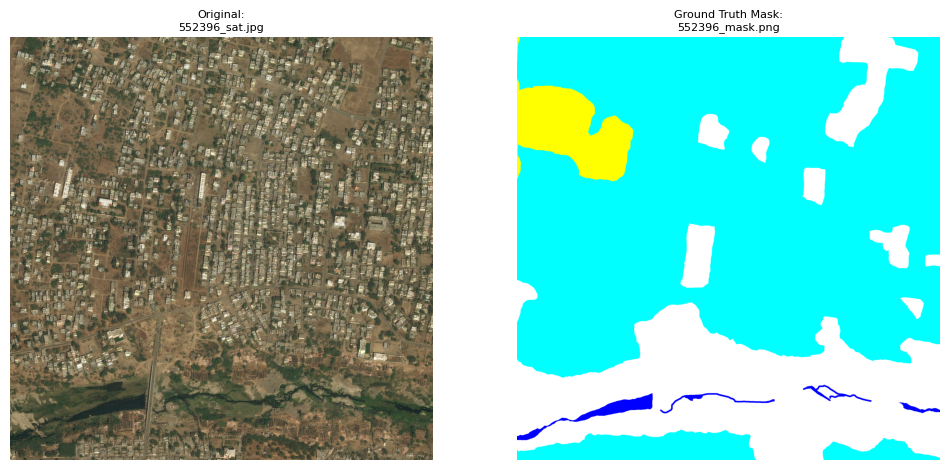

In [36]:
# Randomly selects image and mask from sample set and plot just to double check everything is working correctly.
# Run this a few times to check on a few different image and mask sets
sanity_check(abspath_curr + '/CLERAGY PROJECT/train/train_images/images/' , abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/')

### Setup generators, image preprocessing and loading data to generators

In [43]:
def binarize(img, threshold=128):
  """
  Function to binarize images at some threshold pixel value

  Parameters:
    img: image in numpy matrix
    threshold: pixel threshold to binarize

  Return:
    img: binarized image in numpy matrix
  """
  # Binarize the image
  if np.max(img) > 1:
    img[img > threshold] = 255
    img[img <= threshold] = 0
  else:
    img[img > (threshold/255)] = 255
    img[img <= (threshold/255)] = 0

  return img

In [44]:
def rescale(img):
  """
  Function to rescale image from 0 to 255 to between 0 and 1.

  Parameters:
    img: image in numpy matrix

  Return:
    img: rescaled image in numpy matrix
  """
  if np.max(img) > 1:
    img = np.multiply(img, 1./255)

  return img

In [45]:
def one_hot_encode(img, class_map=None):
  """
  Function to one hot encode ground truth masks

  Parameters:
    img: mask image where each channel represents a color channel
    class_map: class_df

  Return:
    frame: one hot encoded image where each channel represents a class
  """

  if class_map is None:
    class_map = pd.DataFrame({'name':['urban_land','agriculture_land','rangeland','forest_land','water','barren_land','unknown'],
                              'r':[0,255,255,0,0,255,0],
                              'g':[255,255,0,255,0,255,0],
                              'b':[255,0,255,0,255,255,0]})

  img_copy = copy.deepcopy(img)
  frame = np.zeros((img.shape[0], img.shape[1], len(class_map))).astype('int')

  class_channel = 0

  for index, row in class_df.iterrows():
    new_img = copy.deepcopy(img_copy[::,::,::])

    R = new_img[::,::,0]
    G = new_img[::,::,1]
    B = new_img[::,::,2]

    # OHE each class type
    new_img[(R == row['r']/255) & (G == row['g']/255) & (B == row['b']/255)] = 2
    new_img[new_img < 2] = 0
    new_img[new_img == 2] = 1

    new_channel = copy.deepcopy(new_img[::,::,0])

    # Take first layer since they are all the same and put into OHE mask
    frame[::,::,class_channel] = new_channel

    class_channel+=1

  return frame


In [46]:
def reverse_one_hot_encode(img, class_map=None):
  """
  Function to reverse one hot encode 7 class channel to 3 channel RGB mask

  Parameters:
    img: image of one hot encoded mask image where each channel represents a class
    class_map: class_df

  Return:
    rgb_img: reversed one hot encoded image of RGB channels
  """

  if class_map is None:
    class_map = pd.DataFrame({'name':['urban_land','agriculture_land','rangeland','forest_land','water','barren_land','unknown'],
                              'r':[0,255,255,0,0,255,0],
                              'g':[255,255,0,255,0,255,0],
                              'b':[255,0,255,0,255,255,0]})

  img = binarize(img)

  all_red_channels = []
  all_green_channels = []
  all_blue_channels = []

  class_channel = 0

  for index, row in class_df.iterrows():

    current_class_channel = copy.deepcopy(img[::,::,class_channel])

    temp_rgb = np.zeros((img.shape[0], img.shape[1], 3))

    # if pixel value > 128 then put 0s in R, 255 in g, 255 in b
    # or corresponding RGB for each class

    if row['r'] > 0:
      temp_rgb[::,::,0] = current_class_channel
    if row['g'] > 0:
      temp_rgb[::,::,1] = current_class_channel
    if row['b'] > 0:
      temp_rgb[::,::,2] = current_class_channel

    all_red_channels.append(copy.deepcopy(temp_rgb[::,::,0]))
    all_green_channels.append(copy.deepcopy(temp_rgb[::,::,1]))
    all_blue_channels.append(copy.deepcopy(temp_rgb[::,::,2]))

    class_channel += 1

  red_stack = np.dstack(tuple(all_red_channels))
  green_stack = np.dstack(tuple(all_green_channels))
  blue_stack = np.dstack(tuple(all_blue_channels))

  rgb_img = np.zeros((img.shape[0], img.shape[1], 3))

  rgb_img[::,::,0] = np.max(red_stack, axis=2)
  rgb_img[::,::,1] = np.max(green_stack, axis=2)
  rgb_img[::,::,2] = np.max(blue_stack, axis=2)

  return rgb_img

In [47]:
def preprocessor_images(image, b_threshold=128):
  """
  Function to combine preprocessing steps to feed into ImageDataGenerator.
  'Masks' have to binarize then rescale. 'Images' just have to rescale.

  Parameters:
    image: image in numpy (x,y,3)
    b_threshold: binary threshold value for pixels, default at 128.

  Return:
    final_img: final image to return from preprocessor after going through
              all processing steps.
  """
  final_img = rescale(image)

  return final_img

In [48]:
def preprocessor_masks(image, b_threshold=128, class_map=None):
  """
  Function to combine preprocessing steps to feed into ImageDataGenerator.
  'Masks' have to binarize then rescale. 'Images' just have to rescale.

  Parameters:
    image: image in numpy (x,y,3)
    class_map: mapping dataframe of classes and their corresponding RGB values for one hot encoding into separate channels
    b_threshold: binary threshold value for pixels, default at 128.

  Return:
    final_img: final image to return from preprocessor after going through
              all processing steps.
  """
  image = one_hot_encode(image, class_map)
  final_img = rescale(image)

  return final_img

In [49]:
def data_generator(img_folder, mask_folder, batch_size, imsize, num_classes, first_n=None):
  """
  Function to create data generator object of images and masks.

  Parameters:
    img_folder: directory path to images folder
    mask_folder: directory path to masks folder
    batch_size: batch size to use
    imsize: image height and width and n channels (image height, image width, n of channels)
    first_n: optional, set to some int to choose only first n data points

  Yields:
    (img, mask): tuple of image and mask in np arrays of shape (batch size, image height, image width, n of channels)
  """
  element_counter = 0

  images_list = os.listdir(img_folder) #List of training images
  masks_list = os.listdir(mask_folder) #List of Mask images

  if first_n is None:
    images_list = sorted(images_list)
    masks_list= sorted(masks_list)
  else:
    images_list = sorted(images_list)[:first_n]
    masks_list= sorted(masks_list)[:first_n]

  while (True):
    channel_num = 3
    img = np.zeros((batch_size, imsize, imsize, channel_num)).astype('float')
    mask = np.zeros((batch_size, imsize, imsize, num_classes)).astype('int')

    for i in range(element_counter, element_counter+batch_size):

      # Read an image from folder and resize
      train_img = plt.imread(img_folder+'/'+images_list[i])
      train_img =  cv2.resize(train_img, (imsize, imsize))

      # Read corresponding mask from folder and resize
      train_mask = plt.imread(mask_folder+'/'+masks_list[i])
      train_mask = cv2.resize(train_mask, (imsize, imsize))

      #Add pre-processing steps
      train_img = preprocessor_images(train_img)
      train_mask = preprocessor_masks(train_mask)

      #add to array - img[0], img[1], and so on to created np framework
      mask[i-element_counter] = train_mask
      img[i-element_counter] = train_img

    element_counter+=batch_size

    # If we've reached the end of the batch, set element_counter back to 0 to start next batch
    if(element_counter+batch_size>=len(images_list)):
      element_counter=0

    yield (img, mask)

In [50]:
# Set model metadata parameters
train_samples = 532
val_samples = 65
batch_size = 4
num_classes = 7
imsize = 612

In [51]:
# Create data generator objects for training and validation data for U-Net
train_gen = data_generator(img_folder = abspath_curr + '/CLERAGY PROJECT/train/train_images/images/',
                     mask_folder = abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/',
                     batch_size = batch_size,
                     imsize = imsize,
                     num_classes = num_classes,
                     first_n = train_samples)

val_gen = data_generator(img_folder = abspath_curr + '/CLERAGY PROJECT/val/val_images/images/',
                   mask_folder = abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/',
                   batch_size = batch_size,
                   imsize = imsize,
                   num_classes = num_classes,
                   first_n = val_samples)

In [52]:
# Create data generator objects for training and validation data for transfer learning
transfer_learning_model_input_size = (512, 512, 3)

train_gen_tl = data_generator(img_folder = abspath_curr + '/CLERAGY PROJECT/train/train_images/images/',
                     mask_folder = abspath_curr + '/CLERAGY PROJECT/train/train_masks/masks/',
                     batch_size = 1,
                     imsize = transfer_learning_model_input_size[0],
                     num_classes = num_classes,
                     first_n = train_samples)

val_gen_tl = data_generator(img_folder = abspath_curr + '/CLERAGY PROJECT/val/val_images/images/',
                   mask_folder = abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/',
                   batch_size = 1,
                   imsize = transfer_learning_model_input_size[0],
                   num_classes = num_classes,
                   first_n = val_samples)

# 7. Model Training and Evaluation


# **Metrics, Loss, and Optimizer**


Metrics:
*   Our primary metric for evaluating model performance is the pixel-wise Dice Coefficient, which measures the overlap between the ground truth and predicted masks. The Dice Coefficient is particularly useful for segmentation tasks, especially when dealing with imbalanced classes. It is calculated using the formula:

  $Eqn (1):$
  
  $Dice = \frac{2 |A∩B|}{|A| + |B|} = \frac{2TP}{2TP + FN + FP}$

    Where A represents the set of pixels in the ground truth mask (the actual, true mask).B represents the set of pixels in the predicted mask (the model's predicted mask).|A ∩ B| is the count of pixels that are common to both A and B (the overlap between the ground truth and the predicted mask).|A| and |B| represent the count of pixels in A and B, respectively.

*   We will also use Precision and Recall as additional metrics to evaluate how effectively our model identifies False Positives (FP) and False Negatives (FN).

Loss:


* we will be using the pixel-wise Dice Coefficient as a loss which is calculated as

  $Eqn (2):$
  
  $Dice Loss = 1-  Dice = 1- \frac{2 |A∩B|}{|A| + |B|} = 1-\frac{2TP}{2TP + FN + FP}$     

* The Dice Loss is more robust to class imbalances and edge detection than cross entropy.


Optimizer:
*  We will be using the [Adam optimizer](https://keras.io/api/optimizers/adam/), a stochastic gradient descent method that adapts the estimation of both first-order and second-order moments. This optimizer is widely recognized by the machine learning community for its effectiveness in image segmentation tasks.
*  Specifically, the Adam optimizer will reduce the need for manual tuning of the learning rate schedule, as it automatically adjusts the learning rate during training. Moreover, it will adaptively assign a unique learning rate to each parameter, which can be highly beneficial for improving model performance.
*   To ensure stability, we will set an initial learning rate of 1e-5 and implement a learning rate scheduler that decreases the learning rate by a factor of 10 if there is no improvement for 3 consecutive epochs (patience of 3).









#### **UNET Model Implementation**

In [118]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
import numpy as np
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import backend as K
from tensorflow.keras.activations import softmax
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model


# Function to make directory (you need to define this function if it's not available)
def make_directory(path):
    if not os.path.exists(path):
        os.makedirs(path)

# Make directory for saving model
abspath_curr = '/content/drive/My Drive/'  # Set your directory path here
make_directory(abspath_curr + '/result/model/')

def softmax_axis(x):
    """
    Function to wrap Keras' Softmax activation function in order to deliver a value to the 'axis' parameter when defining model.
    Parameters:
      x: np array to perform Softmax on
    Return:
      softmax(x, axis=3): Ensures Softmax function is applied to the 3rd axis, depth along channels
    """
    return softmax(x, axis=3)

def get_crop_shape(target, refer):
    """
    Function to get new heights and widths to allow for cropping
    and ensure proper size to allow for U-Net model concatenation between 2 outputs of Conv blocks.
    This is part of the U-Net's skip connections.

    Parameters:
      target: target to crop
      refer: reference for crop

    Return:
      (ch1, ch2), (cw1, cw2): heights and widths of new sizes to allow for proper cropping and concatenation.
    """
    # width, the 3rd dimension
    cw = (target.shape[2] - refer.shape[2])
    assert (cw >= 0)
    if cw % 2 != 0:
        cw1, cw2 = int(cw / 2), int(cw / 2) + 1
    else:
        cw1, cw2 = int(cw / 2), int(cw / 2)

    # height, the 2nd dimension
    ch = (target.shape[1] - refer.shape[1])
    assert (ch >= 0)
    if ch % 2 != 0:
        ch1, ch2 = int(ch / 2), int(ch / 2) + 1
    else:
        ch1, ch2 = int(ch / 2), int(ch / 2)

    return (ch1, ch2), (cw1, cw2)


def unet(pretrained_weights = None, input_size = (612,612,3), num_classes=7):
    """
    Function to build U-Net network architecture.
    """
    keras.backend.clear_session()
    concat_axis = 3
    inputs = layers.Input(shape=input_size)

    # Encoding path
    conv1 = layers.Conv2D(64, (3, 3), padding='same', name='conv1_1')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Activation('relu')(conv1)
    conv1 = layers.Conv2D(64, (3, 3), padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Activation('relu')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Activation('relu')(conv2)
    conv2 = layers.Conv2D(128, (3, 3), padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Activation('relu')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Activation('relu')(conv3)
    conv3 = layers.Conv2D(256, (3, 3), padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Activation('relu')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(512, (3, 3), padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Activation('relu')(conv4)
    conv4 = layers.Conv2D(512, (3, 3), padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Activation('relu')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = layers.Conv2D(1024, (3, 3), padding='same')(pool4)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Activation('relu')(conv5)
    conv5 = layers.Conv2D(1024, (3, 3), padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Activation('relu')(conv5)

    # Decoding path
    up_conv5 = layers.UpSampling2D(size=(2, 2))(conv5)
    ch, cw = get_crop_shape(conv4, up_conv5)
    crop_conv4 = layers.Cropping2D(cropping=(ch, cw))(conv4)
    up6 = layers.concatenate([up_conv5, crop_conv4], axis=concat_axis)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(up6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Activation('relu')(conv6)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Activation('relu')(conv6)

    up_conv6 = layers.UpSampling2D(size=(2, 2))(conv6)
    ch, cw = get_crop_shape(conv3, up_conv6)
    crop_conv3 = layers.Cropping2D(cropping=(ch, cw))(conv3)
    up7 = layers.concatenate([up_conv6, crop_conv3], axis=concat_axis)
    conv7 = layers.Conv2D(256, (3, 3), padding='same')(up7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Activation('relu')(conv7)
    conv7 = layers.Conv2D(256, (3, 3), padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Activation('relu')(conv7)

    up_conv7 = layers.UpSampling2D(size=(2, 2))(conv7)
    ch, cw = get_crop_shape(conv2, up_conv7)
    crop_conv2 = layers.Cropping2D(cropping=(ch, cw))(conv2)
    up8 = layers.concatenate([up_conv7, crop_conv2], axis=concat_axis)
    conv8 = layers.Conv2D(128, (3, 3), padding='same')(up8)
    conv8 = layers.BatchNormalization()(conv8)
    conv8 = layers.Activation('relu')(conv8)
    conv8 = layers.Conv2D(128, (3, 3), padding='same')(conv8)
    conv8 = layers.BatchNormalization()(conv8)
    conv8 = layers.Activation('relu')(conv8)

    up_conv8 = layers.UpSampling2D(size=(2, 2))(conv8)
    ch, cw = get_crop_shape(conv1, up_conv8)
    crop_conv1 = layers.Cropping2D(cropping=(ch, cw))(conv1)
    up9 = layers.concatenate([up_conv8, crop_conv1], axis=concat_axis)
    conv9 = layers.Conv2D(64, (3, 3), padding='same')(up9)
    conv9 = layers.BatchNormalization()(conv9)
    conv9 = layers.Activation('relu')(conv9)
    conv9 = layers.Conv2D(64, (3, 3), padding='same')(conv9)
    conv9 = layers.BatchNormalization()(conv9)
    conv9 = layers.Activation('relu')(conv9)

    ch, cw = get_crop_shape(inputs, conv9)
    conv9 = layers.ZeroPadding2D(padding=((ch[0], ch[1]), (cw[0], cw[1])))(conv9)

    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(conv9)

    model = models.Model(inputs=inputs, outputs=outputs, name='U-Net')

    if pretrained_weights:
        model.load_weights(pretrained_weights)

    return model

def dice_coef(y_true, y_pred, smooth=1):
    """
    Function to calculate Dice Coefficient
    """
    y_pred = tf.cast(y_pred, dtype=tf.float32)
    y_true = tf.cast(y_true, dtype=tf.float32)
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true), -1) + K.sum(K.square(y_pred), -1) + smooth)

def dice_coef_loss(y_true, y_pred):
    """
    Function to return 1-Dice Coeff as the loss
    """
    return 1 - dice_coef(y_true, y_pred)

def weighted_pixelwise_crossentropy(class_weights):
    """
    Weighted pixel-wise cross entropy loss
    """
    def loss(y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        y_true = tf.cast(y_true, dtype=tf.float32)
        epsilon = K.epsilon()
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        return - tf.reduce_sum(tf.math.multiply(y_true * tf.math.log(y_pred), class_weights))

    return loss

# Example usage:
# model = unet(pretrained_weights='path_to_weights.h5', input_size=(imsize, imsize, 3), num_classes=num_classes)
model = unet(input_size=(612, 612, 3), num_classes=7)
opt = Adam(learning_rate=1e-5)  # Updated syntax for learning rate
model.compile(optimizer=opt, loss=dice_coef_loss, metrics=[dice_coef, tf.keras.metrics.MeanIoU(num_classes=7), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

model.summary()


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 612, 612, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_1 (Conv2D)          │ (None, 612, 612, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 612, 612, 64)   │            256 │ conv1_1[0][0]          │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 612, 612, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 612, 612, 64)   │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 612, 612, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 612, 612, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 306, 306, 64)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 306, 306, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 306, 306, 128)  │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 306, 306, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 306, 306, 128)  │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 306, 306, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 306, 306, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 153, 153, 128)  │              0 │ activation_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 153, 153, 256)  │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 31,402,887 (119.79 MB)

 Trainable params: 31,391,111 (119.75 MB)

 Non-trainable params: 11,776 (46.00 KB)

 Set Up Callbacks

In [119]:
import tensorflow as tf
from tensorflow.keras import callbacks

# Set up paths for saving the model
model_save_path = abspath_curr + '/result/model/transfer_learning_modelv3_epoch18_21.h5'

# ModelCheckpoint callback
# Save only the model weights (ensure file extension is `.weights.h5`)
model_checkpoint_cb = callbacks.ModelCheckpoint(
    filepath=abspath_curr + '/result/model/transfer_learning_modelv3_epoch18_21.weights.h5',  # Corrected to save weights only
    save_best_only=True,  # Save only the best model (based on validation performance)
    save_weights_only=True  # Save weights only, not the full model
)

# EarlyStopping callback
early_stopping_cb = callbacks.EarlyStopping(
    patience=4,  # Number of epochs with no improvement before stopping training
    restore_best_weights=True  # Restore the best model weights when stopping early
)

# ReduceLROnPlateau callback
reduce_lr_on_plateau_cb = callbacks.ReduceLROnPlateau(
    factor=0.1,  # Reduce the learning rate by a factor of 0.1
    patience=3,  # Number of epochs with no improvement before reducing the learning rate
)

# You can adjust the above paths based on where you want to save the model.
# If you'd like to save the entire model (including architecture), change `save_weights_only=False`.



#### **Model Training**

In [120]:
history = model.fit(train_gen,
                    epochs = 10,
                    initial_epoch = 6,
                    steps_per_epoch = train_samples//batch_size,
                    validation_data = val_gen,
                    validation_steps = val_samples//batch_size,
                    verbose=1,
                    batch_size=batch_size,
                    callbacks=[model_checkpoint_cb, early_stopping_cb, reduce_lr_on_plateau_cb]
                    )

Epoch 7/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 287s 2s/step - dice_coef: 0.6149 - loss: 0.3851 - mean_io_u: 0.2570 - precision: 0.4416 - recall: 0.0907 - val_dice_coef: 0.6878 - val_loss: 0.3122 - val_mean_io_u: 0.2500 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 8/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 259s 2s/step - dice_coef: 0.7248 - loss: 0.2752 - mean_io_u: 0.2573 - precision: 0.6906 - recall: 0.3858 - val_dice_coef: 0.7422 - val_loss: 0.2578 - val_mean_io_u: 0.2500 - val_precision: 0.5971 - val_recall: 0.5837 - learning_rate: 1.0000e-05
Epoch 9/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 265s 2s/step - dice_coef: 0.7567 - loss: 0.2433 - mean_io_u: 0.2572 - precision: 0.7259 - recall: 0.5053 - val_dice_coef: 0.7506 - val_loss: 0.2494 - val_mean_io_u: 0.2500 - val_precision: 0.5973 - val_recall: 0.5868 - learning_rate: 1.0000e-05
Epoch 10/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 258s 2s/step - dice_coef: 0.7719 - loss: 0.2281 - mean_io_u: 0.2572 - precision: 0.7392 - recall

#### ****U-Net Architecture Validation Results****

Define a Helper Function for Resizing Images

In [122]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

def load_and_preprocess_image(image_path, target_size=(612, 612)):
    """
    Load and preprocess an image to the target size.
    """
    img = load_img(image_path, target_size=target_size)  # Resize image
    img_array = img_to_array(img) / 255.0  # Normalize pixel values
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

def load_and_preprocess_mask(mask_path, target_size=(612, 612)):
    """
    Load and preprocess a mask to the target size.
    """
    mask = load_img(mask_path, target_size=target_size, color_mode="grayscale")  # Resize mask
    mask_array = img_to_array(mask) / 255.0  # Normalize mask values
    mask_array = np.expand_dims(mask_array, axis=0)  # Add batch dimension
    return mask_array


Execute the cell below multiple times to visually examine random samples from the validation dataset along with their predicted masks. The predicted masks will display both the overall prediction and the individual predictions for each channel.

Sanity Check Function Update

In [124]:
def sanity_check(image_dir, mask_dir, predict=False, model=None, predicted_breakdown=False):
    """
    Randomly select validation image and mask, preprocess them, predict, and plot.
    """
    import random
    import os
    import numpy as np
    import matplotlib.pyplot as plt

    # Define class colors based on the table
    class_colors = [
        (0, 255, 255),    # Urban land
        (255, 255, 0),    # Agriculture land
        (255, 0, 255),    # Rangeland
        (0, 255, 0),      # Forest land
        (0, 0, 255),      # Water
        (255, 255, 255),  # Barren land
        (0, 0, 0),        # Unknown
    ]

    def apply_color_map(mask, class_colors):
        """
        Convert a single-channel mask to an RGB mask using the class colors.
        """
        rgb_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, color in enumerate(class_colors):
            rgb_mask[mask == class_id] = color
        return rgb_mask

    # Randomly select an image and its corresponding mask
    image_files = os.listdir(image_dir)
    mask_files = os.listdir(mask_dir)
    idx = random.randint(0, len(image_files) - 1)
    image_path = os.path.join(image_dir, image_files[idx])
    mask_path = os.path.join(mask_dir, mask_files[idx])

    # Preprocess the image and mask
    image = load_and_preprocess_image(image_path)
    mask = load_and_preprocess_mask(mask_path)
    mask_rgb = apply_color_map(mask[0].squeeze().astype(np.uint8), class_colors)

    # Plot original image and mask
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 3, 1)
    plt.title(f"Original:\n{os.path.basename(image_path)}")
    plt.imshow(image[0])  # Remove batch dimension for visualization
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title(f"Ground Truth Mask:\n{os.path.basename(mask_path)}")
    plt.imshow(mask_rgb)  # RGB mask visualization
    plt.axis("off")

    if predict and model:
        # Predict mask
        pred_mask = model.predict(image)[0]  # Predict on the preprocessed image
        pred_mask = np.argmax(pred_mask, axis=-1)  # Get class with highest probability
        pred_mask_rgb = apply_color_map(pred_mask.astype(np.uint8), class_colors)

        plt.subplot(1, 3, 3)
        plt.title("Predicted Mask: U-Net")
        plt.imshow(pred_mask_rgb)  # RGB predicted mask
        plt.axis("off")

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


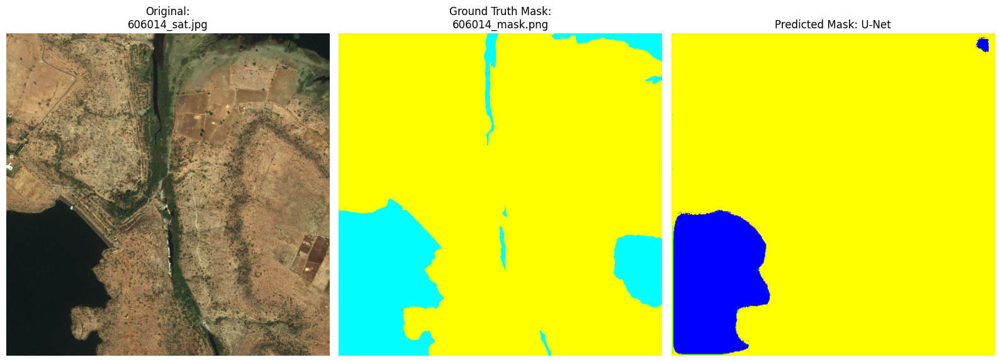

In [65]:
# Directory paths
val_images_dir = abspath_curr + '/CLERAGY PROJECT/val/val_images/images/'
val_masks_dir = abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/'

# Perform sanity check with predictions
sanity_check(val_images_dir, val_masks_dir, predict=True, model=model, predicted_breakdown=True)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


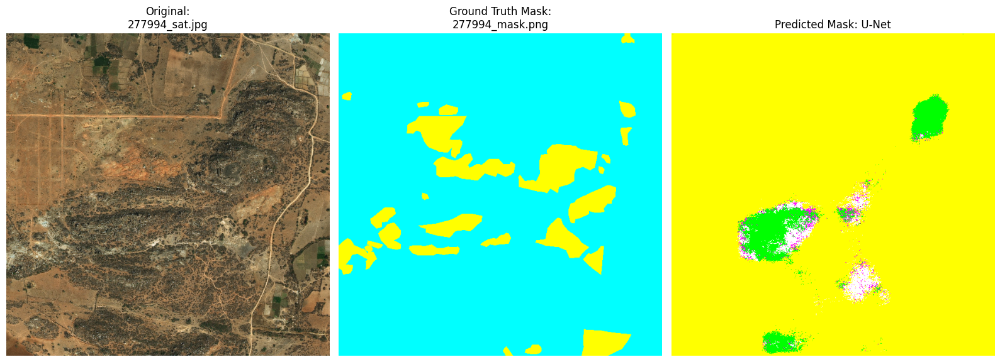

In [67]:
# Directory paths
val_images_dir = abspath_curr + '/CLERAGY PROJECT/val/val_images/images/'
val_masks_dir = abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/'

# Perform sanity check with predictions
sanity_check(val_images_dir, val_masks_dir, predict=True, model=model, predicted_breakdown=True)


1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


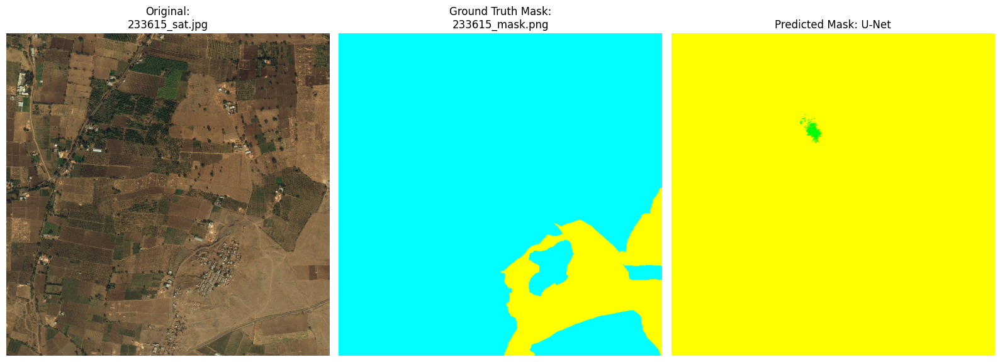

In [58]:
# Randomly select validation image and mask then predict and plot prediction.
# Run this a few times to check on a few different image and mask sets
sanity_check(abspath_curr + '/CLERAGY PROJECT/val/val_images/images/' , abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/', predict=True, model=model, predicted_breakdown=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


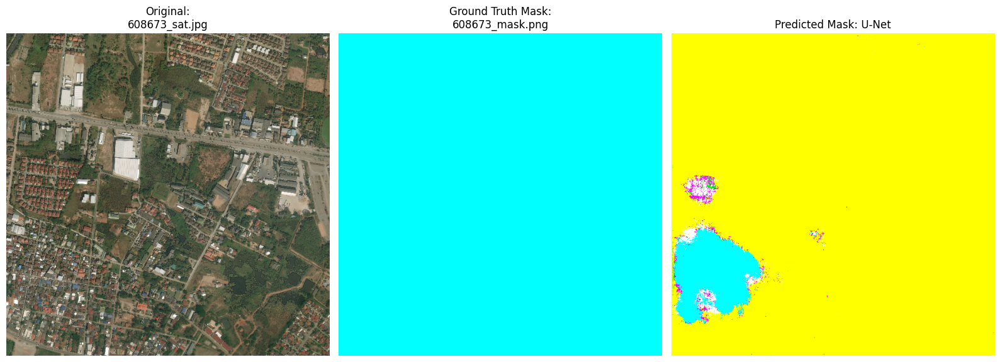

In [61]:
# Randomly select validation image and mask then predict and plot prediction.
# Run this a few times to check on a few different image and mask sets
sanity_check(abspath_curr + '/CLERAGY PROJECT/val/val_images/images/' , abspath_curr + '/CLERAGY PROJECT/val/val_masks/masks/', predict=True, model=model, predicted_breakdown=True)

#### ****U-Net Architecture Test Results****

In [125]:
def test_model_on_test_data(test_dir, model, class_colors):
    """
    Randomly selects a test image, predicts its segmentation mask, and visualizes the result.

    Args:
        test_dir (str): Path to the test dataset containing test images.
        model (tf.keras.Model): Trained U-Net model for prediction.
        class_colors (list): List of RGB tuples for each class.

    Returns:
        None: Displays the test image and its predicted mask.
    """
    import random
    import os
    import matplotlib.pyplot as plt
    import numpy as np
    from tensorflow.keras.preprocessing.image import load_img, img_to_array

    def load_and_preprocess_image(image_path, target_size=(612, 612)):
        """
        Load and preprocess an image to the target size.
        """
        img = load_img(image_path, target_size=target_size)  # Resize image
        img_array = img_to_array(img) / 255.0  # Normalize pixel values
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        return img_array

    def apply_color_map(mask, class_colors):
        """
        Convert a single-channel mask to an RGB mask using the class colors.
        """
        rgb_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, color in enumerate(class_colors):
            rgb_mask[mask == class_id] = color
        return rgb_mask

    # Randomly select a test image
    test_images = os.listdir(test_dir)
    random_idx = random.randint(0, len(test_images) - 1)
    test_image_path = os.path.join(test_dir, test_images[random_idx])

    # Preprocess the test image
    test_image = load_and_preprocess_image(test_image_path)

    # Predict the segmentation mask
    pred_mask = model.predict(test_image)[0]  # Predict on the preprocessed image
    pred_mask = np.argmax(pred_mask, axis=-1)  # Get class with highest probability
    pred_mask_rgb = apply_color_map(pred_mask.astype(np.uint8), class_colors)

    # Visualize the test image and prediction
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title(f"Test Image:\n{os.path.basename(test_image_path)}")
    plt.imshow(test_image[0])  # Remove batch dimension for visualization
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Predicted Mask: U-Net")
    plt.imshow(pred_mask_rgb)  # RGB predicted mask visualization
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Run this cell below multiple times to visually inspect random testing dataset and the model's predicted masks. The predicted masks will show the overall prediction and the prediction per channel.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


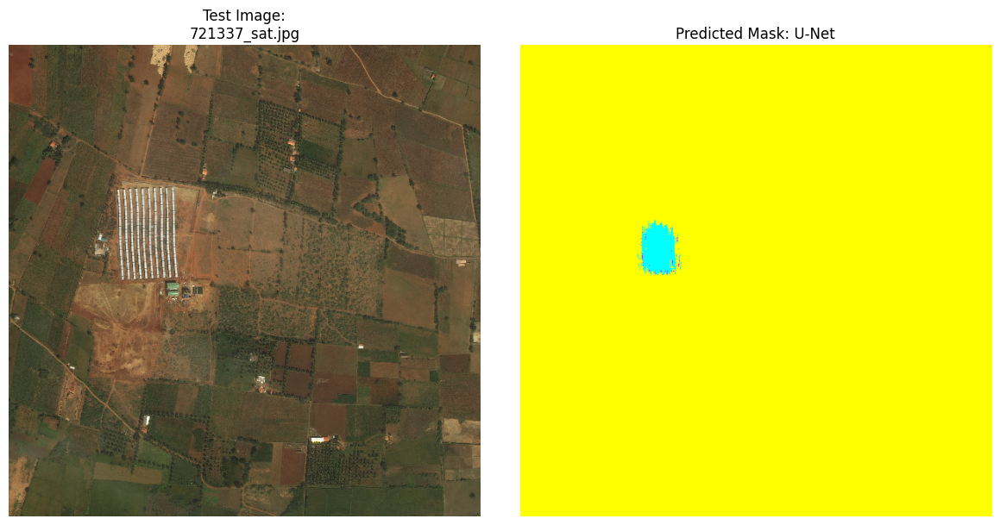

In [69]:
# Define your class colors
class_colors = [
    (0, 255, 255),    # Urban land
    (255, 255, 0),    # Agriculture land
    (255, 0, 255),    # Rangeland
    (0, 255, 0),      # Forest land
    (0, 0, 255),      # Water
    (255, 255, 255),  # Barren land
    (0, 0, 0),        # Unknown
]

# Test directory path
test_dir = abspath_curr + '/CLERAGY PROJECT/test/'

# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


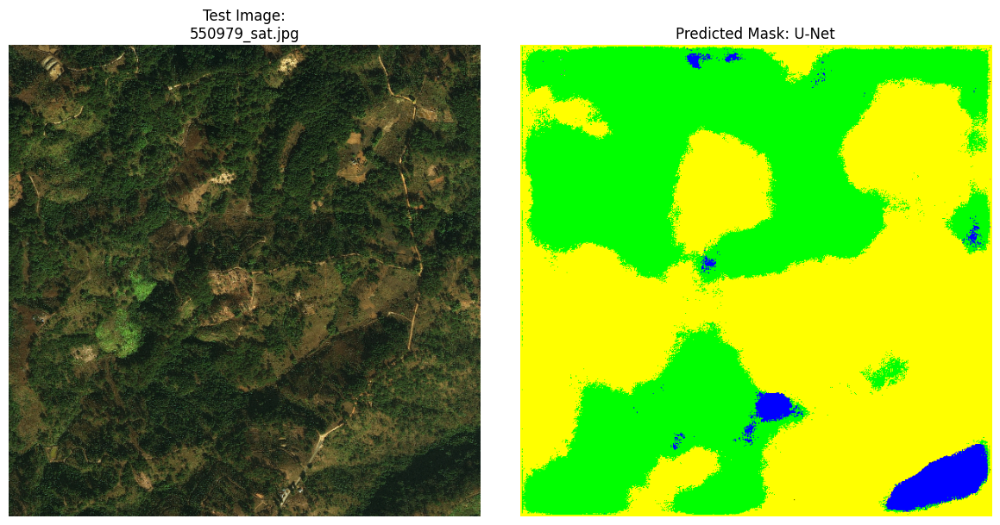

In [71]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


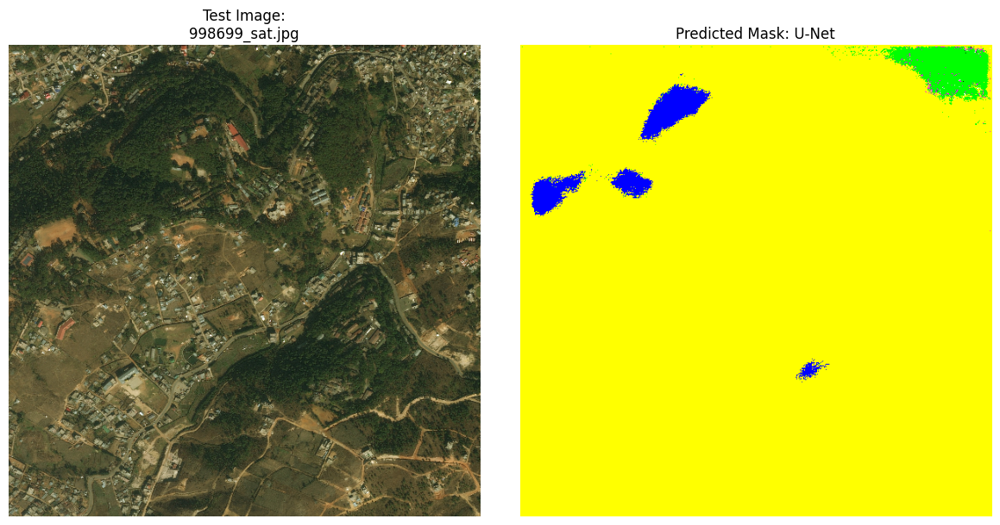

In [72]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


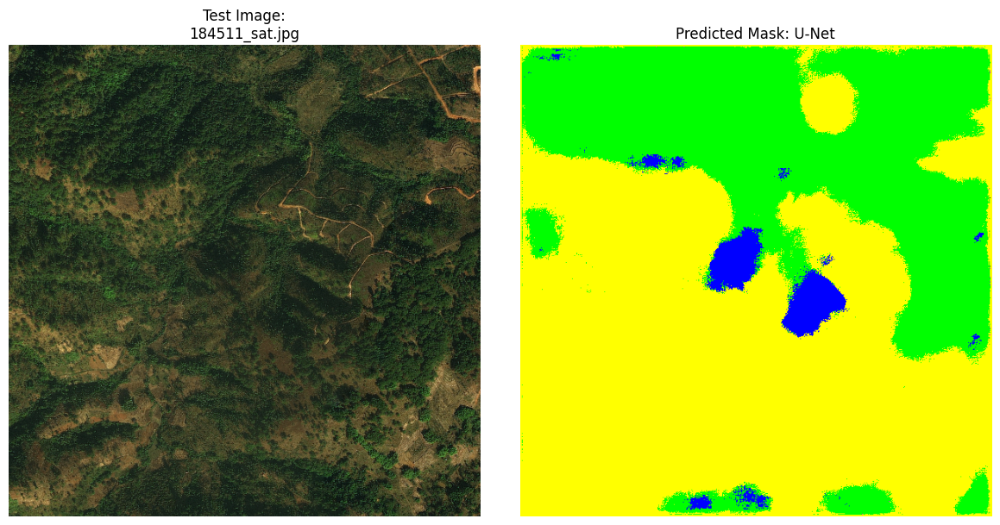

In [112]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


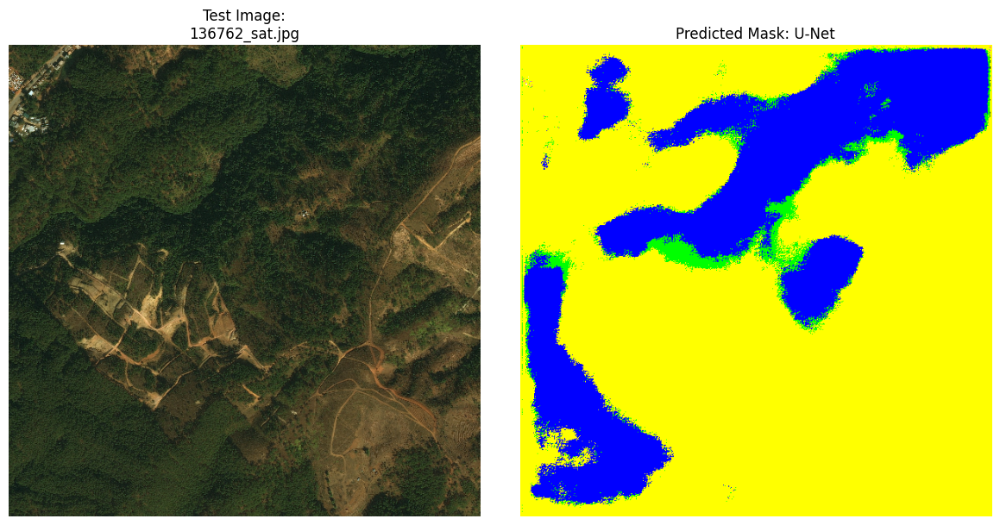

In [79]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


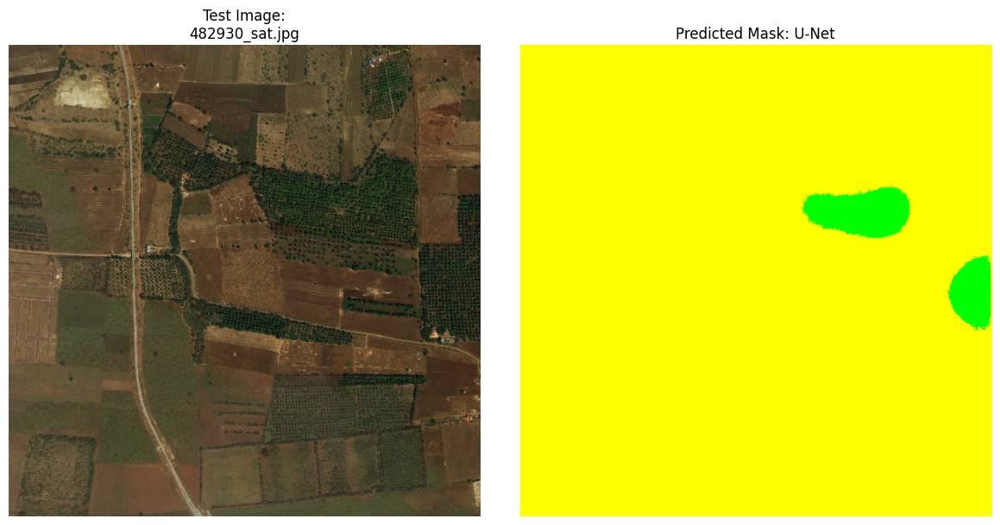

In [80]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


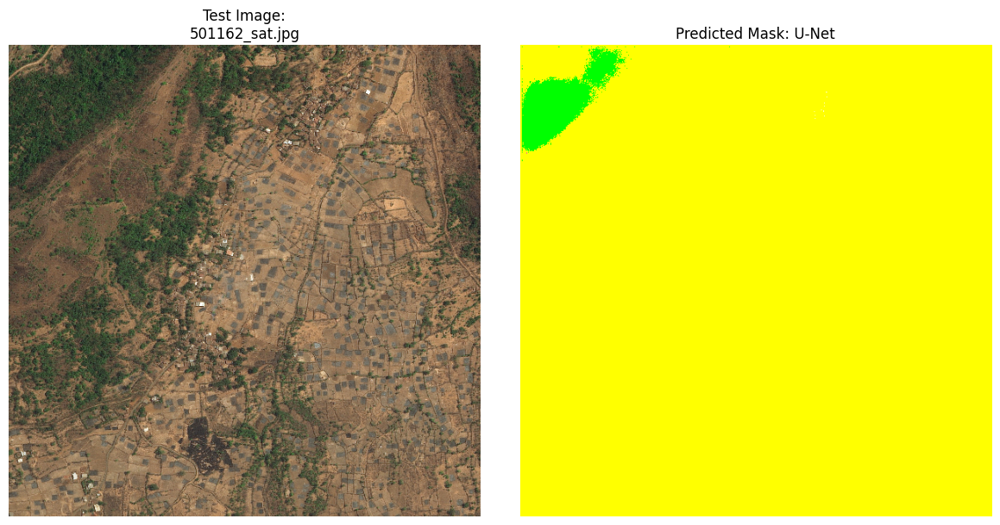

In [94]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


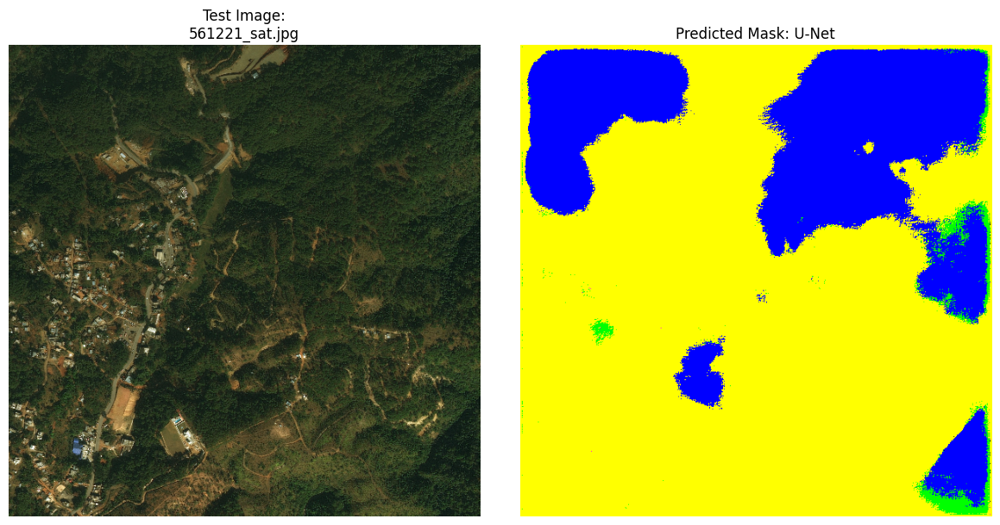

In [102]:
# Define your class colors
class_colors = [
    (0, 255, 255),    # Urban land
    (255, 255, 0),    # Agriculture land
    (255, 0, 255),    # Rangeland
    (0, 255, 0),      # Forest land
    (0, 0, 255),      # Water
    (255, 255, 255),  # Barren land
    (0, 0, 0),        # Unknown
]

# Test directory path
test_dir = abspath_curr + '/CLERAGY PROJECT/test/'

# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


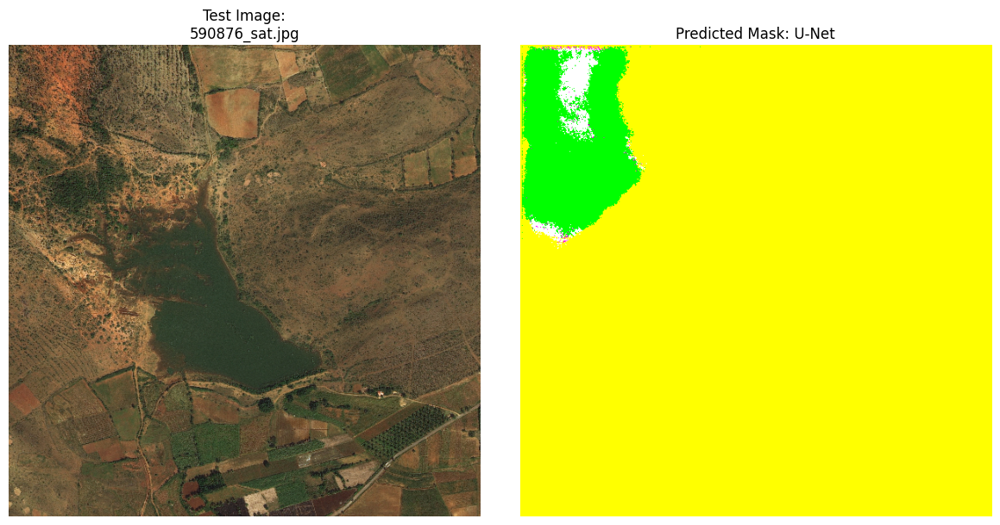

In [105]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


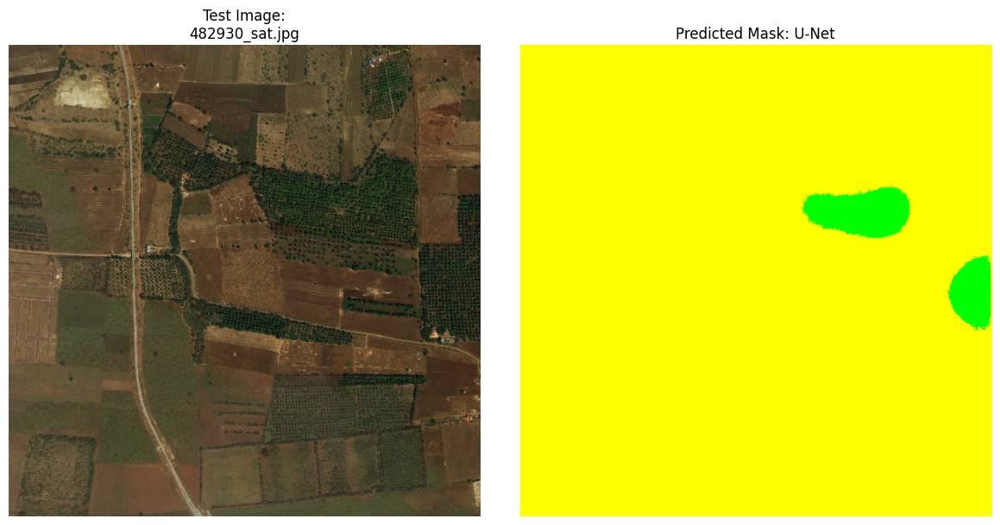

In [108]:
# Test the model on random test images
test_model_on_test_data(test_dir=test_dir, model=model, class_colors=class_colors)


**Saving the Model and History**


Since we're saving the model weights separately using ModelCheckpoint, we'll save the model architecture and history using pickle and TensorFlow's methods.

In [134]:
from tensorflow.keras.saving import register_keras_serializable
from tensorflow.keras.models import model_from_json
import pickle

# Register custom functions
@register_keras_serializable()
def dice_coef(y_true, y_pred):
    # Your implementation here
    pass

@register_keras_serializable()
def dice_coef_loss(y_true, y_pred):
    # Your implementation here
    pass

# Paths
model_json_path = abspath_curr + '/result/model/model_architecture.json'
history_path = abspath_curr + '/result/model/training_history.pkl'
weights_path = abspath_curr + '/result/model/transfer_learning_modelv3_epoch18_21.weights.h5'

# Load model architecture
custom_objects = {'dice_coef': dice_coef, 'dice_coef_loss': dice_coef_loss}
with open(model_json_path, 'r') as json_file:
    loaded_model = model_from_json(json_file.read(), custom_objects=custom_objects)
print("Model architecture loaded.")

# Load weights
loaded_model.load_weights(weights_path)
print("Model weights loaded.")

# Load training history
with open(history_path, 'rb') as file:
    loaded_history = pickle.load(file)
print("Training history loaded.")


Model architecture loaded.
Model weights loaded.
Training history loaded.


In [135]:
import pickle

# Save the model architecture
model_json_path = abspath_curr + '/result/model/model_architecture.json'
with open(model_json_path, 'w') as json_file:
    json_file.write(model.to_json())
print(f"Model architecture saved to {model_json_path}.")

# Save the training history
history_path = abspath_curr + '/result/model/training_history.pkl'
with open(history_path, 'wb') as file:
    pickle.dump(history.history, file)
print(f"Training history saved to {history_path}.")


Model architecture saved to /content/drive/My Drive//result/model/model_architecture.json.
Training history saved to /content/drive/My Drive//result/model/training_history.pkl.


**Loading the Model and History**

To restore the model and history for further use:

In [137]:
from tensorflow.keras.saving import register_keras_serializable
from tensorflow.keras.models import model_from_json
import pickle

# Custom loss function
@register_keras_serializable()
def dice_coef_loss(y_true, y_pred):
    # Your implementation here
    pass

# Paths
model_json_path = abspath_curr + '/result/model/model_architecture.json'
history_path = abspath_curr + '/result/model/training_history.pkl'
weights_path = abspath_curr + '/result/model/transfer_learning_modelv3_epoch18_21.weights.h5'

# Load model architecture
with open(model_json_path, 'r') as json_file:
    loaded_model = model_from_json(json_file.read(), custom_objects={'dice_coef_loss': dice_coef_loss})
print("Model architecture loaded.")

# Load weights
loaded_model.load_weights(weights_path)
print("Model weights loaded.")

# Load training history
with open(history_path, 'rb') as file:
    loaded_history = pickle.load(file)
print("Training history loaded.")


Model architecture loaded.
Model weights loaded.
Training history loaded.


In [136]:
from tensorflow.keras.models import model_from_json

# Load the model architecture
with open(model_json_path, 'r') as json_file:
    loaded_model = model_from_json(json_file.read())
print("Model architecture loaded.")

# Load the weights into the model
loaded_model.load_weights(abspath_curr + '/result/model/transfer_learning_modelv3_epoch18_21.weights.h5')
print("Model weights loaded.")

# Load the training history
with open(history_path, 'rb') as file:
    loaded_history = pickle.load(file)
print("Training history loaded.")

Model architecture loaded.
Model weights loaded.
Training history loaded.


# 8. Conclusion and Future Work

The U-Net model demonstrated promising performance in segmenting complex images,
achieving a Dice Coefficient of 0.789. It showed encouraging results in certain regions,
particularly in classifying forest and urban areas. However, challenges remain with water body
classification, urban misclassifications, and boundary detection. The model's unexpected ability
to detect roads, despite the absence of explicit labels, highlights its potential to learn salient
features independently.
These findings suggest opportunities for enhancing segmentation accuracy through targeted
improvements. Addressing class imbalance, refining labels, and leveraging data augmentation
strategies are expected to improve IoU, recall metrics, and overall model performance. Future
work will focus on fine-tuning hyperparameters, expanding the dataset, and incorporating
advanced augmentation techniques to achieve more robust and accurate segmentation
outcomes.